In [1]:
pip install -U matplotlibrc

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement matplotlibrc (from versions: none)
ERROR: No matching distribution found for matplotlibrc


C:\conda\envs\DLC-CPU\lib\site-packages\numpy\_distributor_init.py:32: UserWarning: loaded more than 1 DLL from .libs:
C:\conda\envs\DLC-CPU\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
C:\conda\envs\DLC-CPU\lib\site-packages\numpy\.libs\libopenblas.TXA6YQSD3GCQQC22GEQ54J2UDCXDXHWN.gfortran-win_amd64.dll
  stacklevel=1)

Bad key savefig.frameon in file C:\conda\envs\DLC-CPU\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 421 ('savefig.frameon : True')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.3.2/matplotlibrc.template
or from the matplotlib source distribution

Bad key verbose.level in file C:\conda\envs\DLC-CPU\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle, line 472 ('verbose.level  : silent      # one of silent, helpful, debug, debug-annoying')
You probably need to get an updated matplotlibrc file from
https://githu

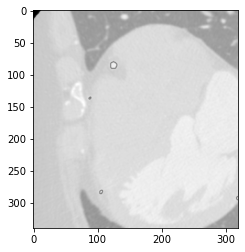

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
from tqdm import tqdm


# Set image path
DATADIR = "C:/Users/Shuo/Desktop/514 project/ASOCA2020Data/0"
DATADIR2 = "C:/Users/Shuo/Desktop/514 project/ASOCA2020Data/0_Train"  # Training Images for only file 0
DATADIR3 = "C:/Users/Shuo/Desktop/514 project/ASOCA2020Data/0_Mask"   # Ground truth
DATADIR4 = "C:/Users/Shuo/Desktop/514 project/ASOCA2020Data/Training" # Training Images for more patients
DATADIR5 = "C:/Users/Shuo/Desktop/514 project/ASOCA2020Data/Training_aug" # Augmented data
DATADIR6 = "C:/Users/Shuo/Desktop/514 project/ASOCA2020Data/Training_mask" # Training Mask


# Classification
CATEGORIES = ["Has","No"]

# Testing
for category in CATEGORIES:
    path = os.path.join(DATADIR, category)
    for img in os.listdir(path):  # iterate over each image 
        img_array = cv2.imread(os.path.join(path,img) ,cv2.IMREAD_GRAYSCALE)  # convert to array
        img_array = img_array[180:520, 150:470]
        plt.imshow(img_array, cmap='gray')  # graph it
        plt.show()  # display!

        break  # we just want one for now so break
    break

In [3]:
# Training Construction
# Citation from https://pythonprogramming.net/using-trained-model-deep-learning-python-tensorflow-keras/

IMG_SIZE = 512

training_data = []

def create_training_data():
    for category in CATEGORIES:
        
        path = os.path.join(DATADIR,category)
        path2 = os.path.join(DATADIR2,category)
        path3 = os.path.join(DATADIR3,category)
        path4 = os.path.join(DATADIR4,category)
        path5 = os.path.join(DATADIR5,category)
        path6 = os.path.join(DATADIR6,category)
        class_num = CATEGORIES.index(category)
        
        for img in tqdm(os.listdir(path)):  # iterate over each image 
            img_array = cv2.imread(os.path.join(path,img) ,cv2.IMREAD_GRAYSCALE)  # convert to array
            
            new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))  # resize to normalize data size
            training_data.append([new_array, class_num])  # add this to our training_data            
                
        for img in tqdm(os.listdir(path2)):  # iterate over each image 
            img_array = cv2.imread(os.path.join(path2,img) ,cv2.IMREAD_GRAYSCALE)  # convert to array
            
            new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))  # resize to normalize data size
            training_data.append([new_array, class_num])  # add this to our training_data   
            
        for img in tqdm(os.listdir(path3)):  # iterate over each image 
            img_array = cv2.imread(os.path.join(path3,img) ,cv2.IMREAD_GRAYSCALE)  # convert to array
            
            new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))  # resize to normalize data size
            training_data.append([new_array, class_num])  # add this to our training_data   
            
        for img in tqdm(os.listdir(path4)):  # iterate over each image 
            img_array = cv2.imread(os.path.join(path4,img) ,cv2.IMREAD_GRAYSCALE)  # convert to array
            
            new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))  # resize to normalize data size
            training_data.append([new_array, class_num])  # add this to our training_data  
            
        for img in tqdm(os.listdir(path5)):  # iterate over each image 
            img_array = cv2.imread(os.path.join(path5,img) ,cv2.IMREAD_GRAYSCALE)  # convert to array
            
            new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))  # resize to normalize data size
            training_data.append([new_array, class_num])  # add this to our training_data   
        
        for img in tqdm(os.listdir(path6)):  # iterate over each image 
            img_array = cv2.imread(os.path.join(path6,img) ,cv2.IMREAD_GRAYSCALE)  # convert to array
            
            new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))  # resize to normalize data size
            training_data.append([new_array, class_num])  # add this to our training_data   


            
create_training_data()


print(len(training_data))

100%|███████████████████████████████████████| 286/286 [00:01<00:00, 171.64it/s]

3692


In [4]:
# Random the training data to improve accuracy

import random

random.shuffle(training_data)

In [5]:
# Construction in order to use in pickle function

X = []
y = []


for features,label in training_data:
    X.append(features)
    y.append(label)
    
X = np.array(X).reshape(-1, IMG_SIZE, IMG_SIZE, 1)

  

print(X[0].reshape(-1, IMG_SIZE,IMG_SIZE, 1))



[[[[255]
   [255]
   [255]
   ...
   [255]
   [255]
   [255]]

  [[255]
   [255]
   [255]
   ...
   [255]
   [255]
   [255]]

  [[255]
   [255]
   [255]
   ...
   [255]
   [255]
   [255]]

  ...

  [[255]
   [255]
   [255]
   ...
   [255]
   [255]
   [255]]

  [[255]
   [255]
   [255]
   ...
   [255]
   [255]
   [255]]

  [[255]
   [255]
   [255]
   ...
   [255]
   [255]
   [255]]]]


In [6]:
# Pickle function that can export training data

import pickle

pickle_out = open("X.pickle","wb")
pickle.dump(X, pickle_out)
pickle_out.close()

pickle_out = open("y.pickle","wb")
pickle.dump(y, pickle_out)
pickle_out.close()

In [7]:
# CNN Training process

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D
# more info on callbakcs: https://keras.io/callbacks/ model saver is cool too.
from tensorflow.keras.callbacks import TensorBoard
import pickle
import time
import numpy as np
import tensorflow as tf
from tensorflow import keras

pickle_in = open("X.pickle","rb")
X = pickle.load(pickle_in)

pickle_in = open("y.pickle","rb")
y = pickle.load(pickle_in)

X = X/255.0

dense_layers = [0]
layer_sizes = [64]
conv_layers = [3]

for dense_layer in dense_layers:
    for layer_size in layer_sizes:
        for conv_layer in conv_layers:
            NAME = "{}-conv-{}-nodes-{}-dense-{}".format(conv_layer, layer_size, dense_layer, int(time.time()))
            print(NAME)

            model = Sequential()

            model.add(Conv2D(layer_size, (3, 3), input_shape=X.shape[1:]))
            model.add(Activation('relu'))
            model.add(MaxPooling2D(pool_size=(2, 2)))

            for l in range(conv_layer-1):
                model.add(Conv2D(layer_size, (3, 3)))
                model.add(Activation('relu'))
                model.add(MaxPooling2D(pool_size=(2, 2)))

            model.add(Flatten())

            for _ in range(dense_layer):
                model.add(Dense(layer_size))
                model.add(Activation('relu'))

            model.add(Dense(1))
            model.add(Activation('sigmoid'))

            tensorboard = TensorBoard(log_dir="logs/{}".format(NAME))

            model.compile(loss='binary_crossentropy',
                          optimizer=keras.optimizers.Adam(1e-4),    #'adam',
                          metrics=['accuracy'],
                          )

            model.fit(X, y,
                      batch_size=2,
                      epochs=6,
                      validation_split=0.3,
                      callbacks=[tensorboard])

model.save('64x3-CNN.model')

C:\conda\envs\DLC-CPU\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\conda\envs\DLC-CPU\lib\site-packages\tensorflow\python\framework\dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\conda\envs\DLC-CPU\lib\site-packages\tensorflow\python\framework\dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\conda\envs\DLC-CPU\lib\site-packages\tensorflow\python\framework\dtypes.py:529: FutureWarning: Passing (type, 1)

3-conv-64-nodes-0-dense-1607106305
Instructions for updating:
Colocations handled automatically by placer.
Train on 2584 samples, validate on 1108 samples
Instructions for updating:
Use tf.cast instead.
Epoch 1/6
2584/2584 [==============================] - 1516s 587ms/sample - loss: 0.4620 - acc: 0.7848 - val_loss: 0.3041 - val_acc: 0.9486
Epoch 2/6
2584/2584 [==============================] - 1511s 585ms/sample - loss: 0.2394 - acc: 0.9129 - val_loss: 0.1397 - val_acc: 0.9567
Epoch 3/6
2584/2584 [==============================] - 1473s 570ms/sample - loss: 0.1135 - acc: 0.9594 - val_loss: 0.1003 - val_acc: 0.9756
Epoch 4/6
2584/2584 [==============================] - 1478s 572ms/sample - loss: 0.0764 - acc: 0.9818 - val_loss: 0.1081 - val_acc: 0.9702
Epoch 5/6
2584/2584 [==============================] - 1497s 579ms/sample - loss: 0.0574 - acc: 0.9822 - val_loss: 0.0455 - val_acc: 0.9874
Epoch 6/6
2584/2584 [==============================] - 1508s 584ms/sample - loss: 0.0415 - acc: 0

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import tensorflow as tf
import skimage.io
from tqdm import tqdm
from skimage.filters import sobel,meijering, sato, hessian
from skimage import transform
from skimage import color
from skimage.morphology import disk
from skimage.segmentation import watershed
from skimage.filters import rank
from skimage.filters import unsharp_mask
from skimage.util import img_as_ubyte
from scipy import ndimage as ndi
from skimage import feature
from skimage.util import img_as_ubyte
from scipy import ndimage as ndi

# Image path for testing
Test = "C:/Users/Shuo/Desktop/514 project/ASOCA2020Data/Final_test/test1"

# Classification category
CATEGORIES = ["Has","No"]

# Process to extract testing file

def prepare(filepath):
    IMG_SIZE = 512  # 50 in txt-based
    img_array = cv2.imread(os.path.join(Test,Test1), cv2.IMREAD_GRAYSCALE)  # read in the image, convert to grayscale
    
    new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))  # resize image to match model's expected sizing
    return new_array.reshape(-1, IMG_SIZE, IMG_SIZE, 1)  # return the image with shaping that TF wants.


def prepare2(filepath):
    IMG_SIZE = 512  # 50 in txt-based
    img_array = cv2.imread(os.path.join(Test,Test1), cv2.IMREAD_GRAYSCALE)  # read in the image, convert to grayscale
    
    #img_array1 = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
    #img_array2 = img_array1[140:390, 150:380]  # ROI
    img_array3 = unsharp_mask(img_array, radius=10, amount=5) # Unshap_Mask filter
    new_array = cv2.resize(img_array3, (IMG_SIZE, IMG_SIZE))  
    return new_array.reshape(-1, IMG_SIZE, IMG_SIZE, 1)  

def prepare3(filepath):
    IMG_SIZE = 512  # 50 in txt-based
    img_array = cv2.imread(os.path.join(Test,Test1), cv2.IMREAD_GRAYSCALE)
    
    new_array1 = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
    new_array = feature.canny(new_array1)  # Canny feature
    return new_array.reshape(-1, IMG_SIZE, IMG_SIZE, 1)  

C:\conda\envs\DLC-CPU\lib\site-packages\ipykernel_launcher.py:132: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_00.png
1


C:\conda\envs\DLC-CPU\lib\site-packages\ipykernel_launcher.py:143: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


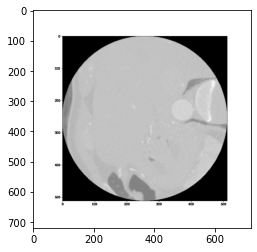

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_01.png
1


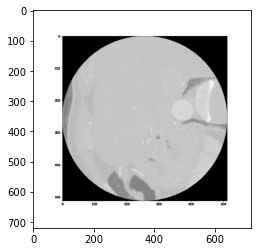

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_02.png
1


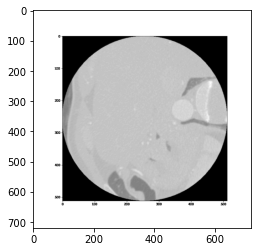

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_03.png
1


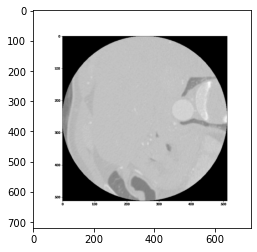

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_04.png
1


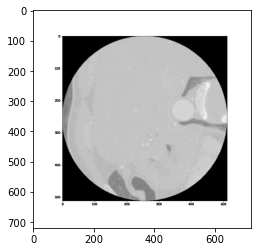

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_05.png
1


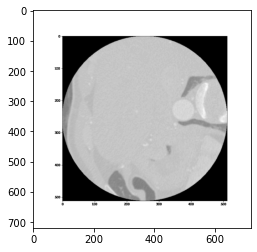

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_06.png
1


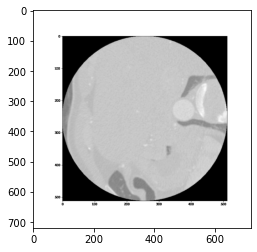

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_07.png
1


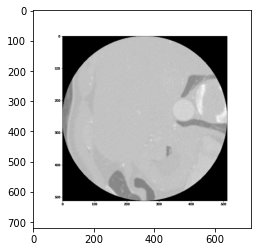

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_08.png
1


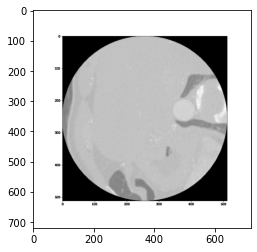

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_09.png
1


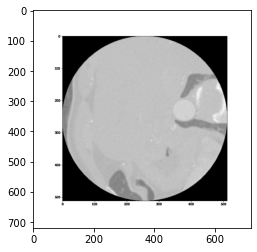

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_10.png
1


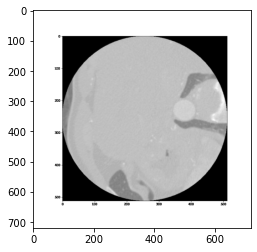

10_100.png
0


C:\conda\envs\DLC-CPU\lib\site-packages\IPython\core\interactiveshell.py:3417: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\conda\envs\DLC-CPU\lib\site-packages\ipykernel_launcher.py:74: UserWarning: C:/Users/Shuo/Desktop/514 project/ASOCA2020Data/Final_test/result\12_00.png is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
C:\conda\envs\DLC-CPU\lib\site-packages\ipykernel_launcher.py:80: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
C:\conda\envs\DLC-CPU\lib\site-packages\ipykernel_launcher.py:82: FutureWa

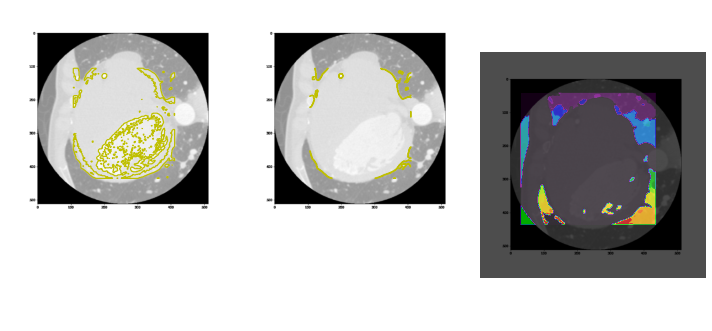

10_101.png
0


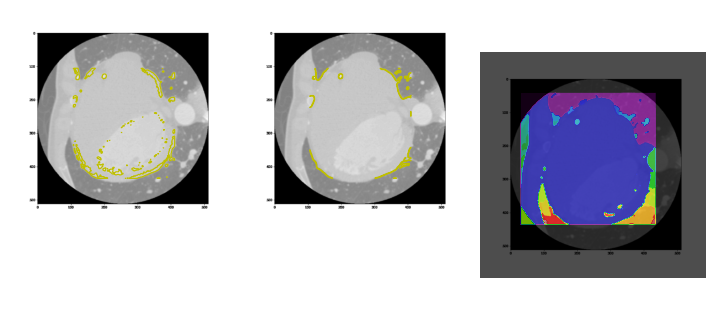

10_102.png
0


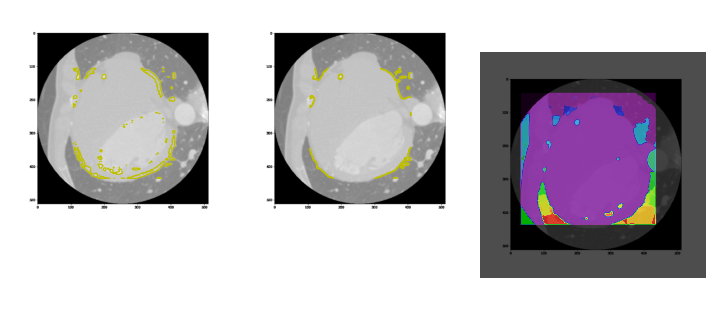

10_103.png
0


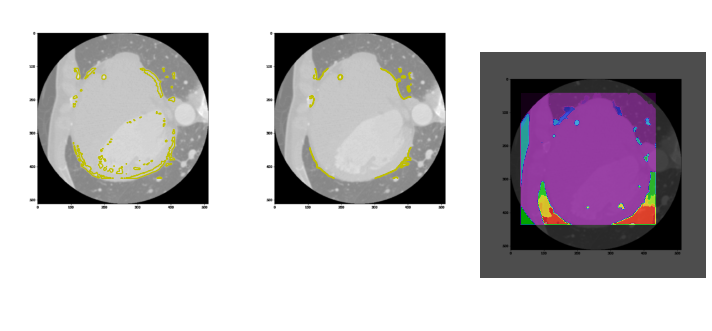

10_104.png
0


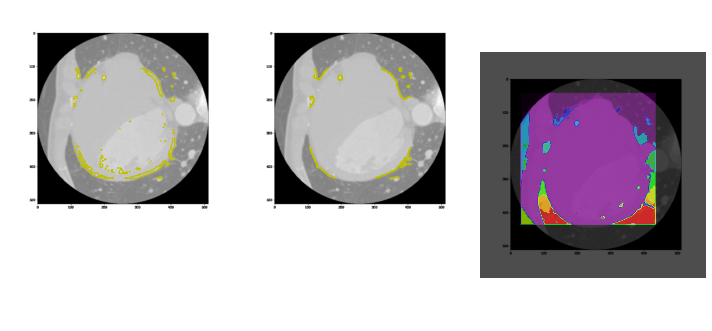

10_105.png
0


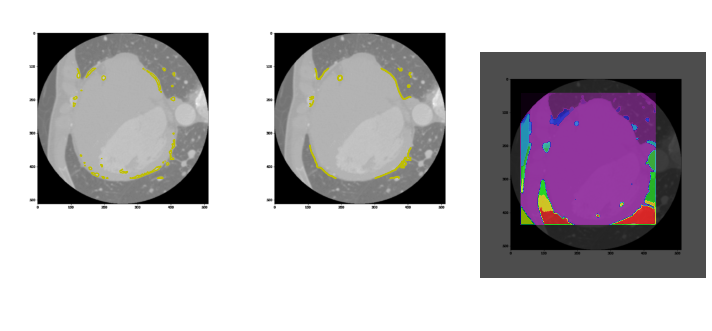

10_106.png
0


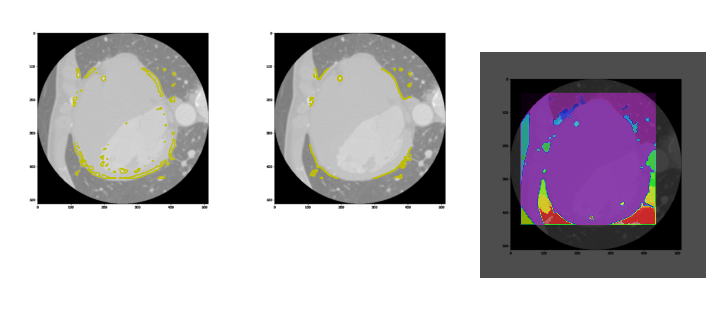

10_107.png
0


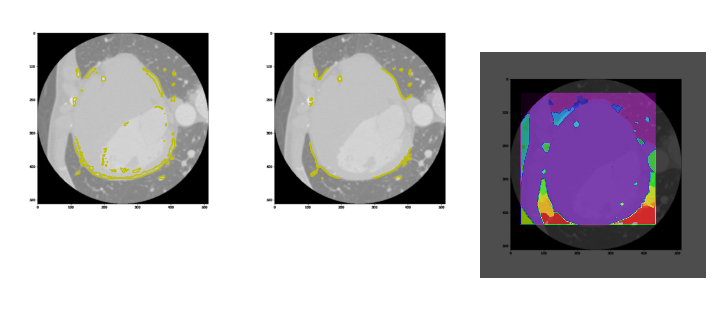

10_108.png
0


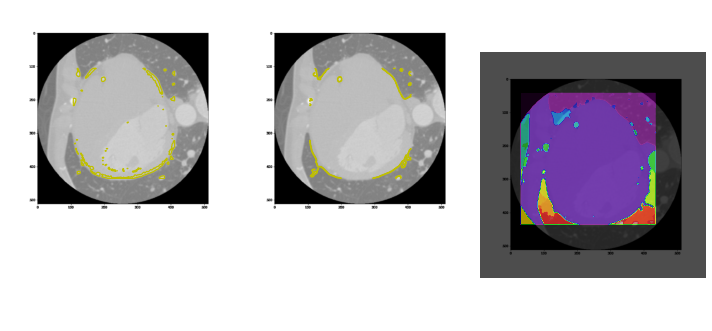

10_109.png
0


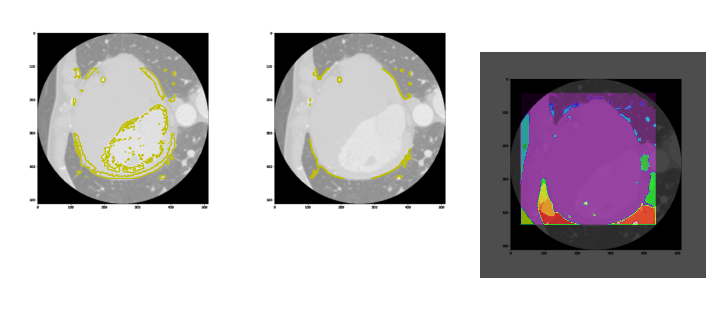

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_11.png
1


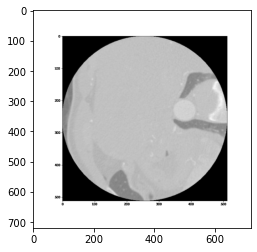

10_110.png
0


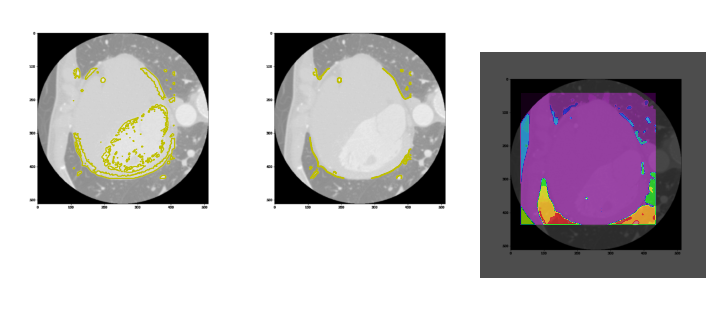

10_111.png
0


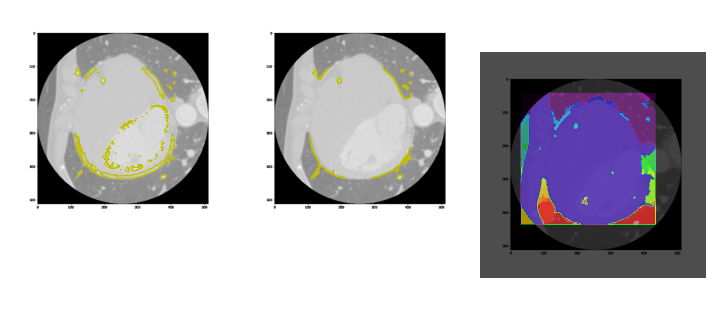

10_112.png
0


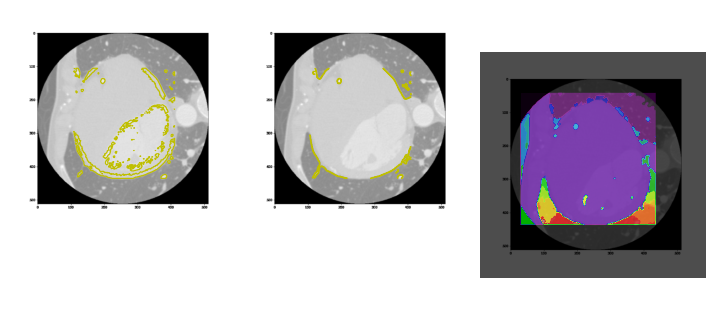

10_113.png
0


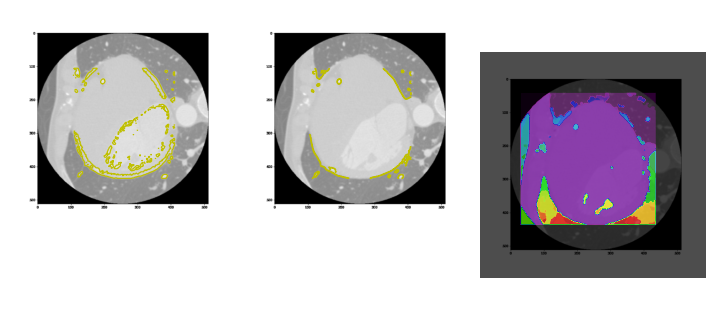

10_114.png
0


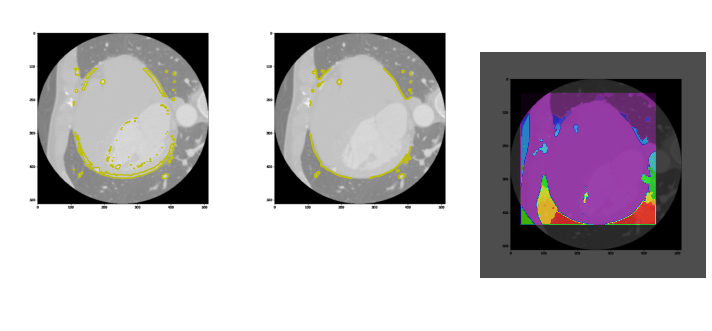

10_115.png
0


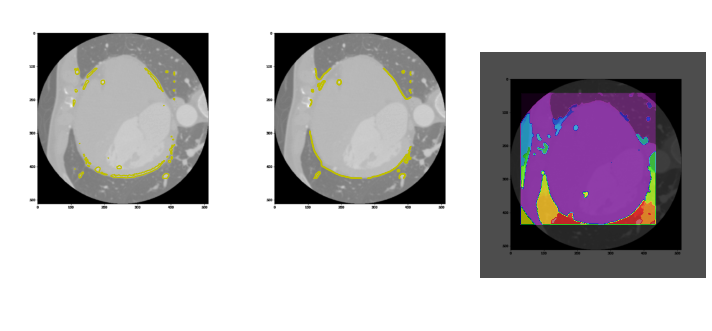

10_116.png
0


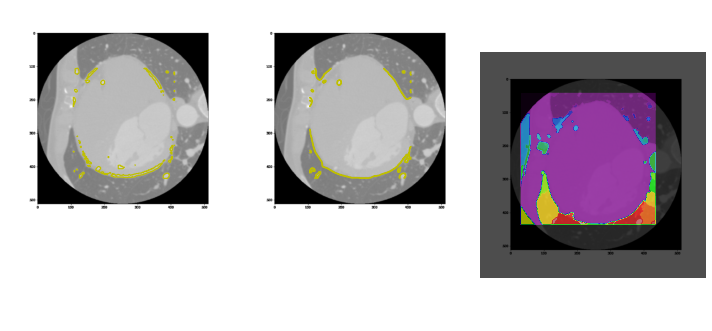

10_117.png
0


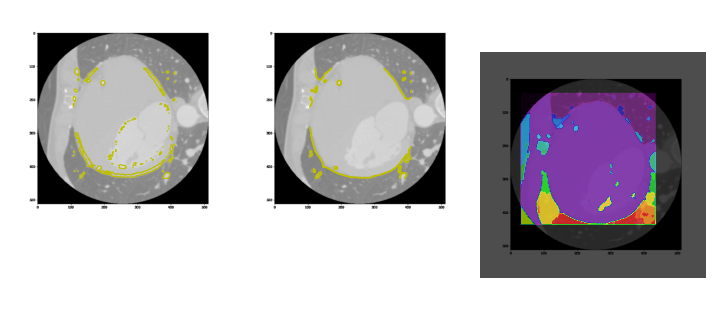

10_118.png
0


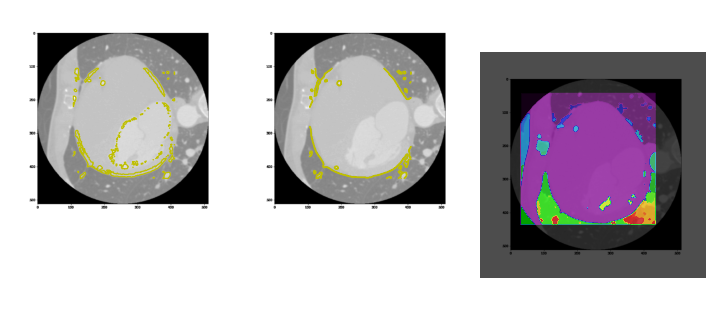

10_119.png
0


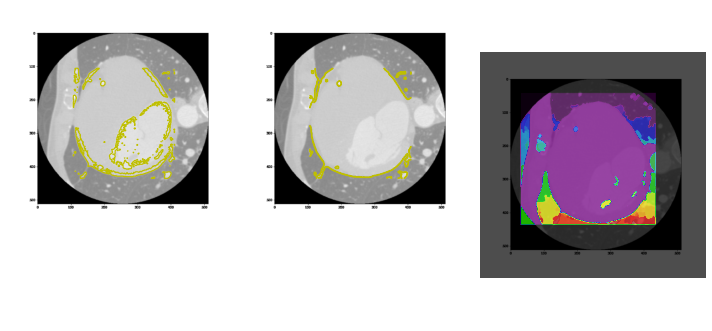

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_12.png
1


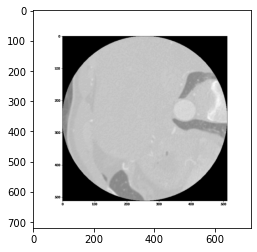

10_120.png
0


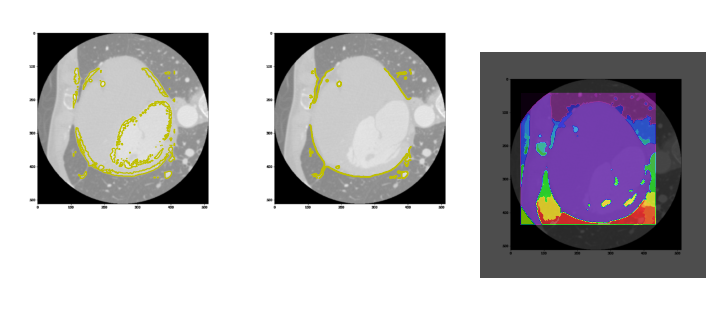

10_121.png
0


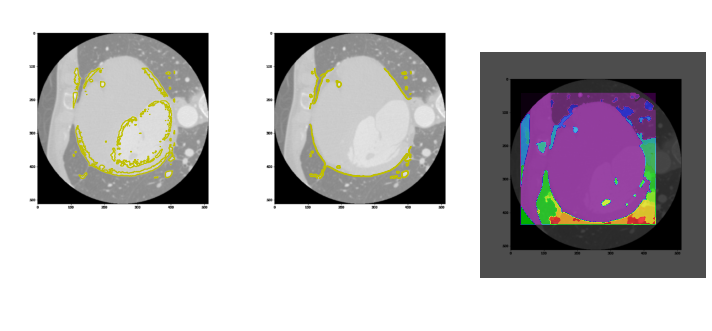

10_122.png
0


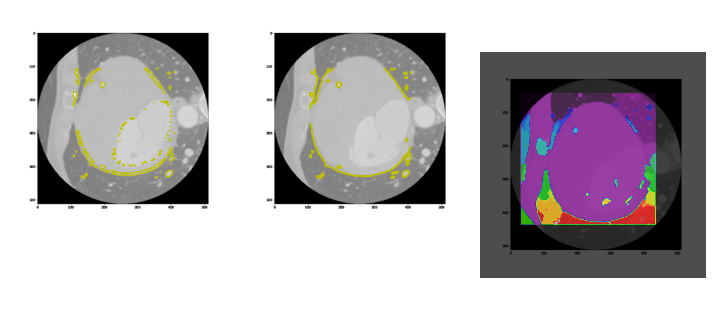

10_123.png
0


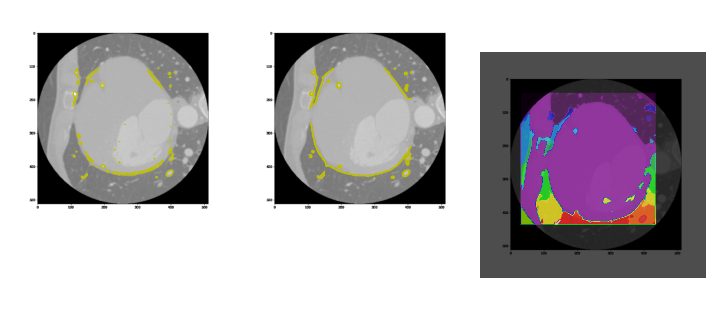

10_124.png
0


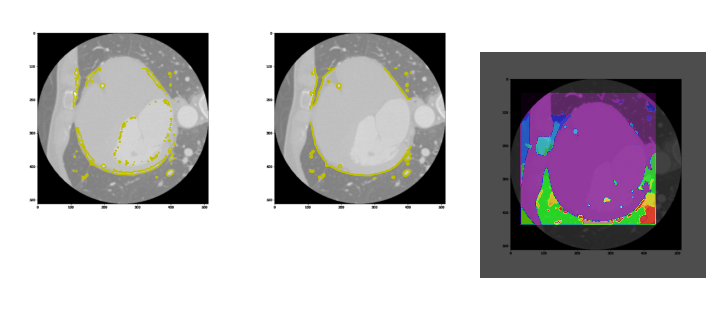

10_125.png
0


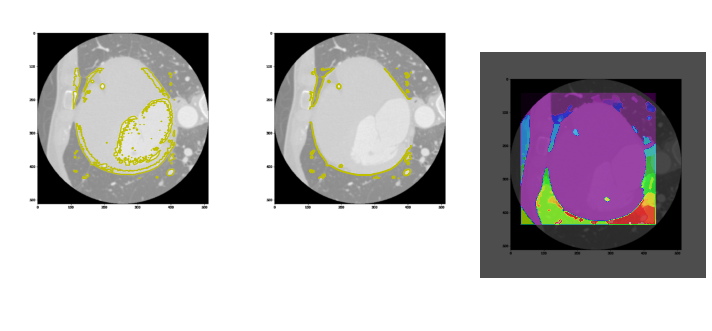

10_126.png
0


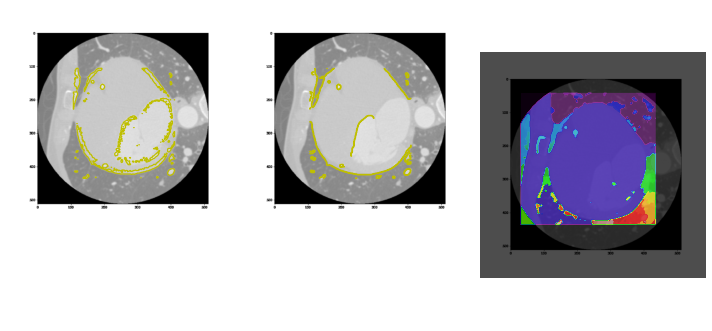

10_127.png
0


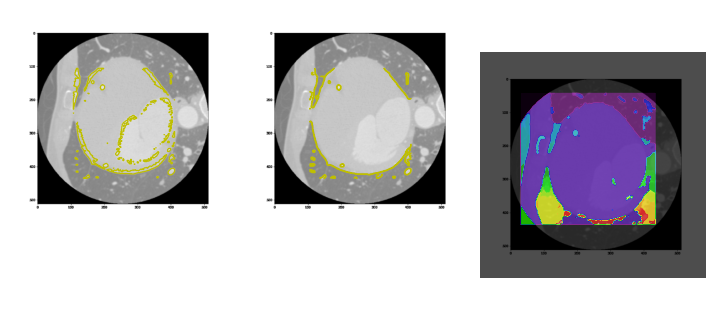

10_128.png
0


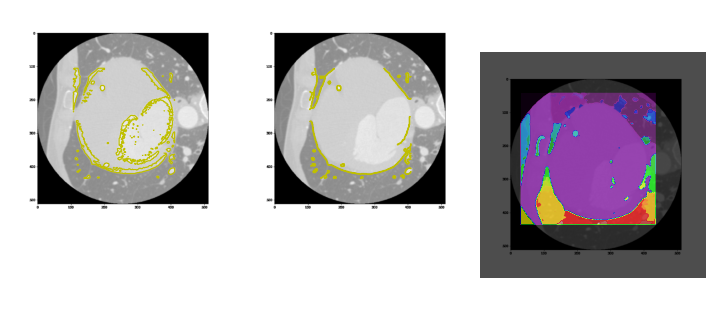

10_129.png
0


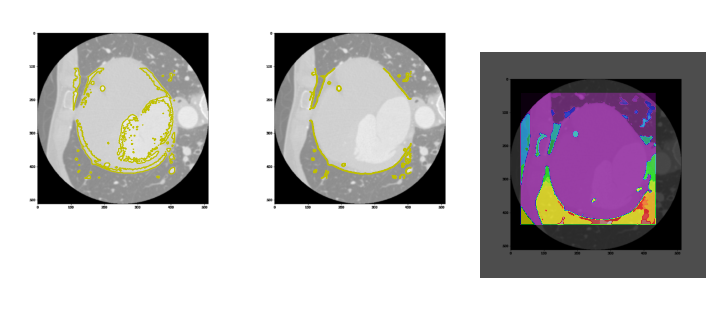

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_13.png
1


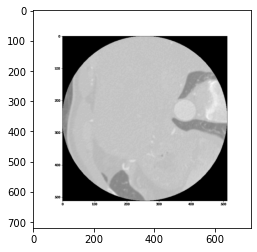

10_130.png
0


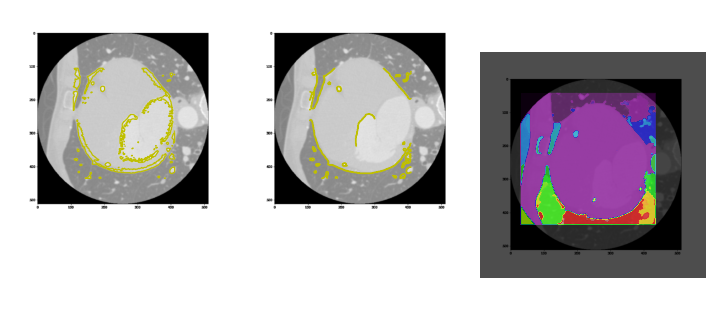

10_131.png
0


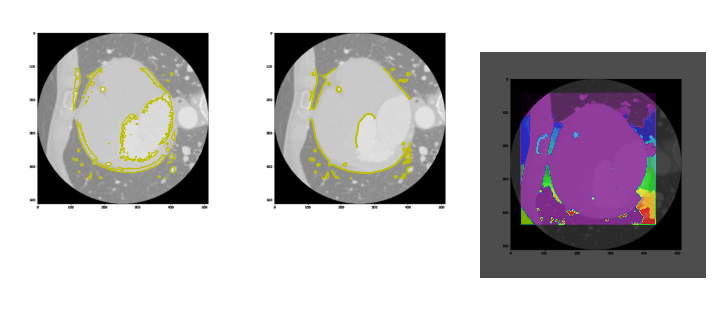

10_132.png
0


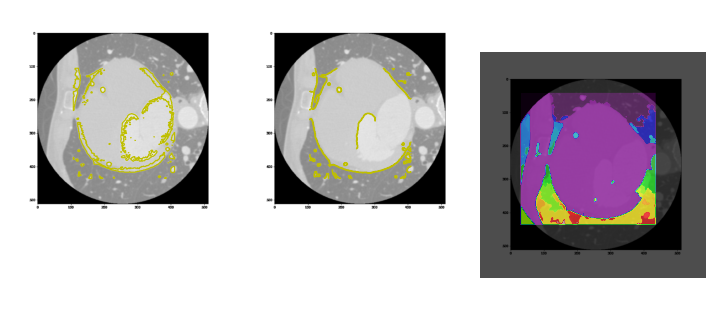

10_133.png
0


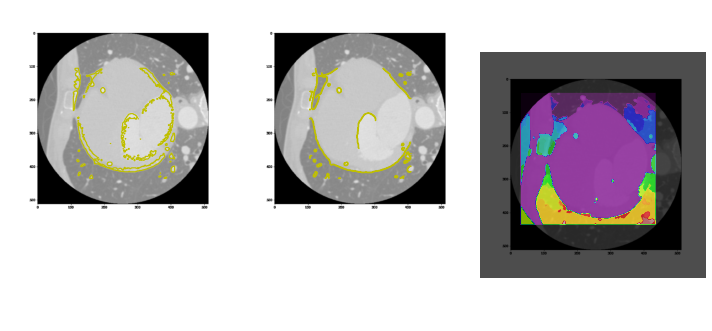

10_134.png
0


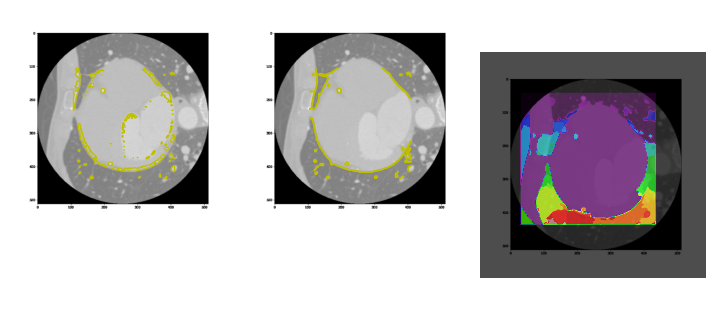

10_135.png
0


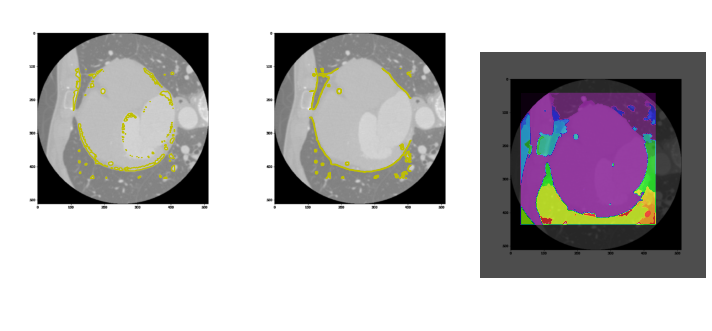

10_136.png
0


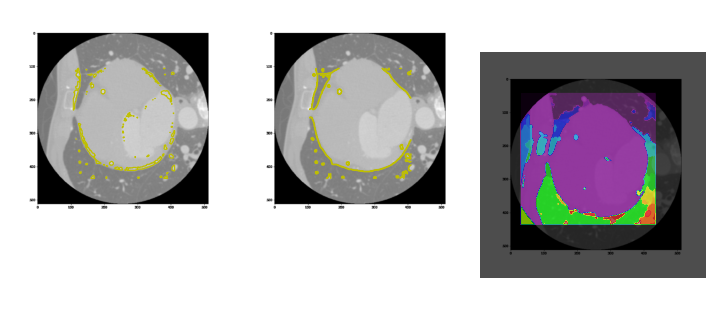

10_137.png
0


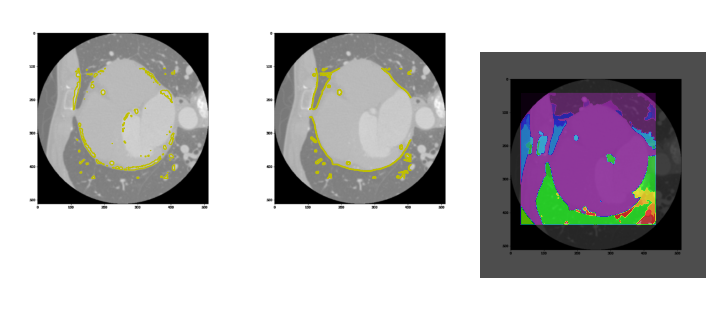

10_138.png
0


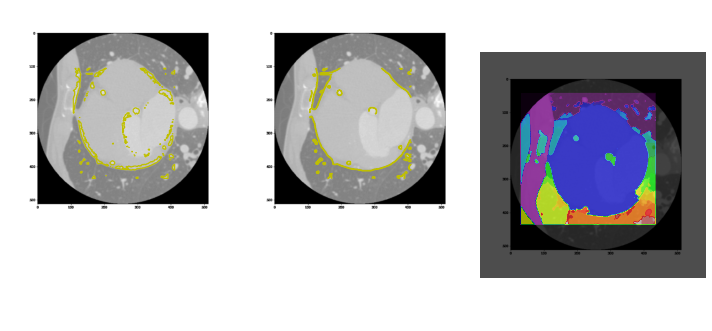

10_139.png
0


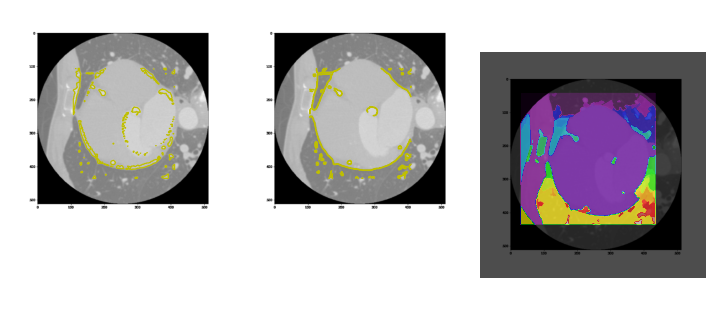

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_14.png
1


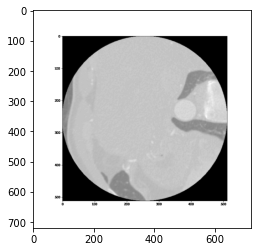

10_140.png
0


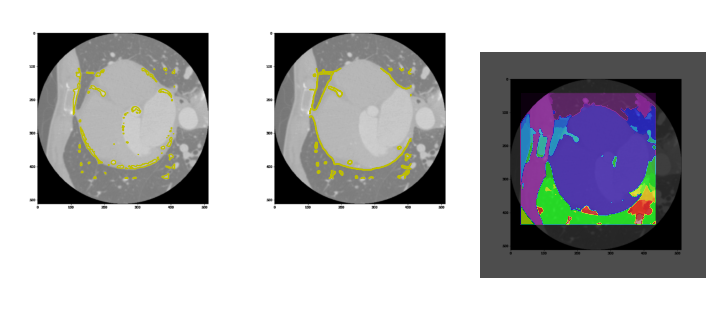

10_141.png
0


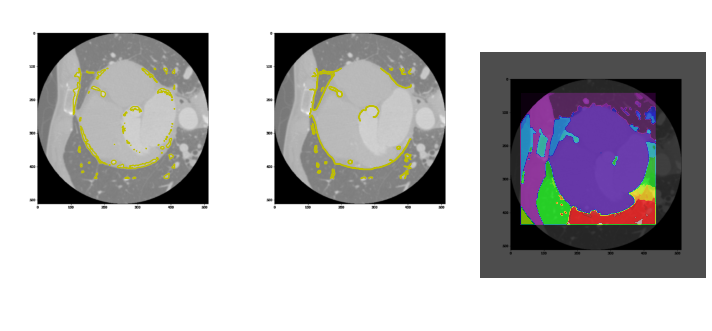

10_142.png
0


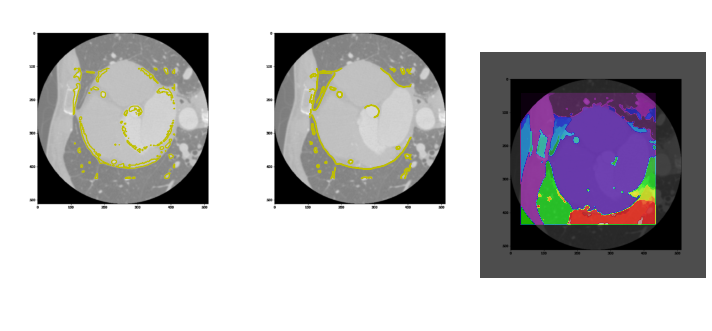

10_143.png
0


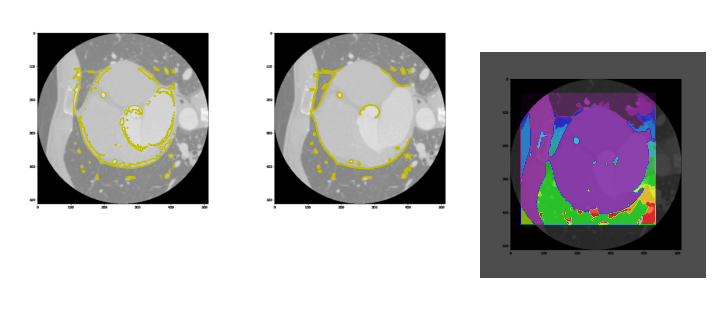

10_144.png
0


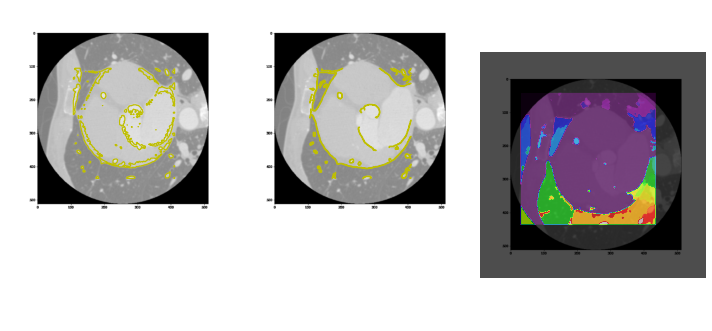

10_145.png
0


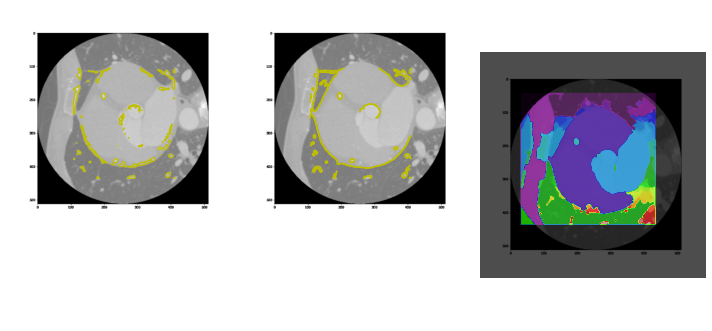

10_146.png
0


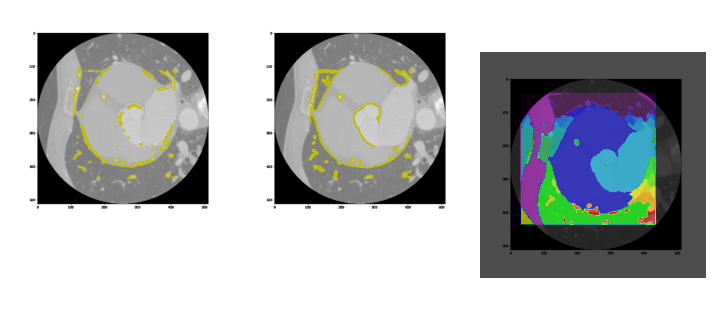

10_147.png
0


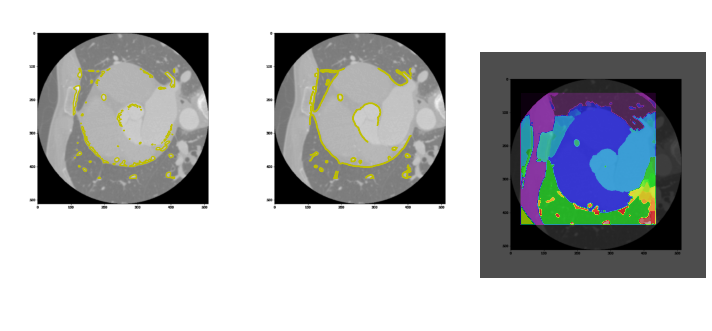

10_148.png
0


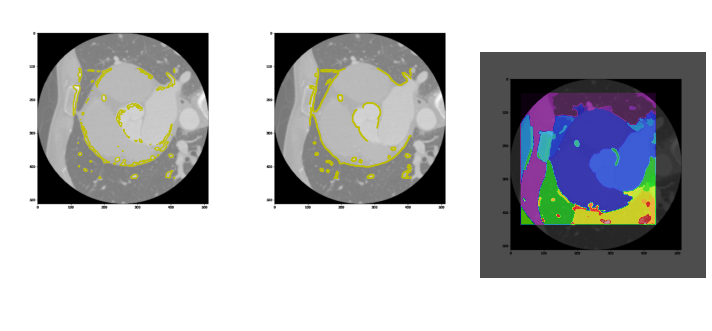

10_149.png
0


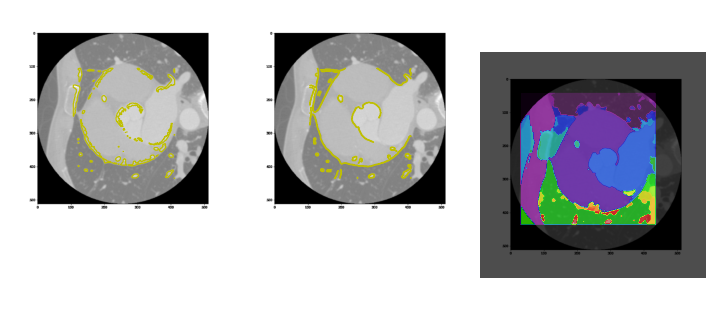

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_15.png
1


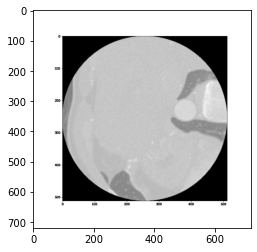

10_150.png
0


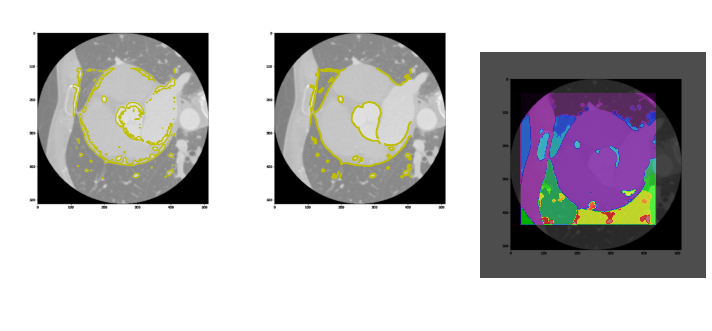

10_151.png
0


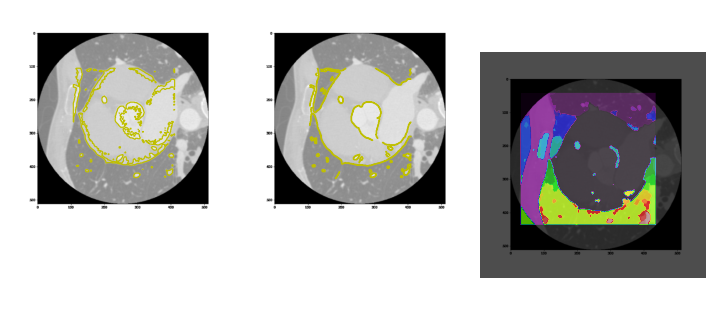

10_152.png
0


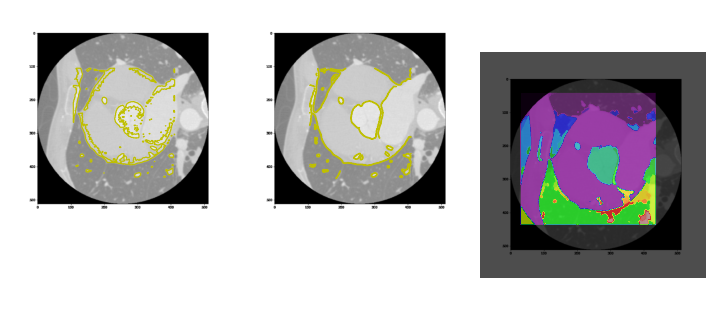

10_153.png
0


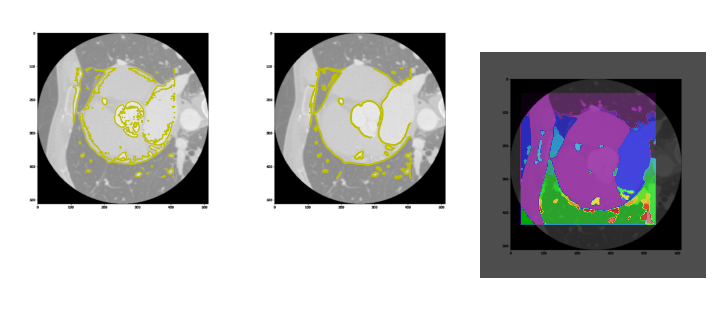

10_154.png
0


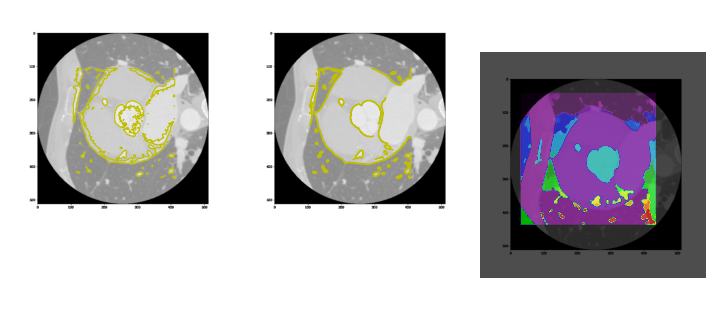

10_155.png
0


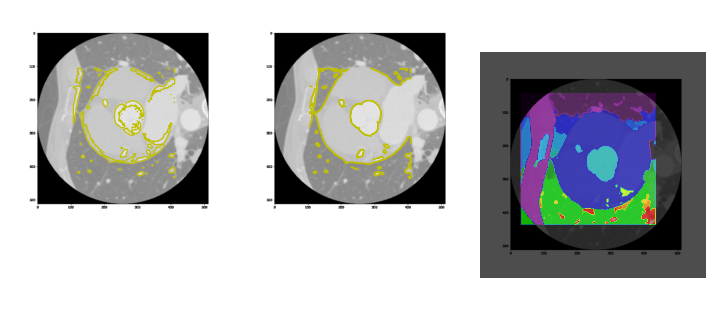

10_156.png
0


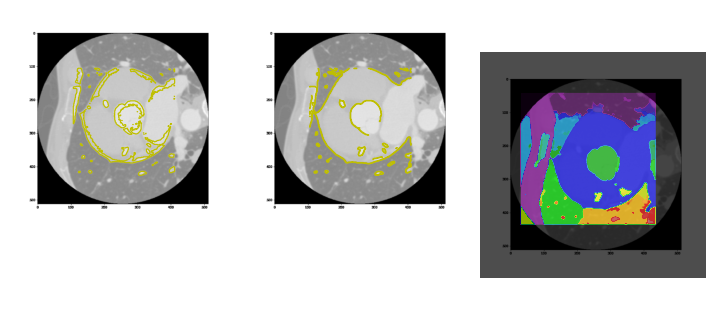

10_157.png
0


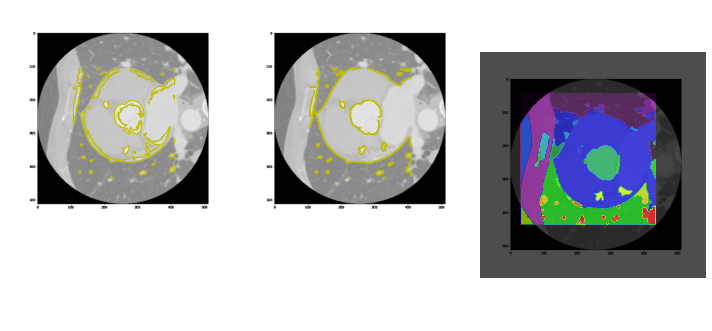

10_158.png
0


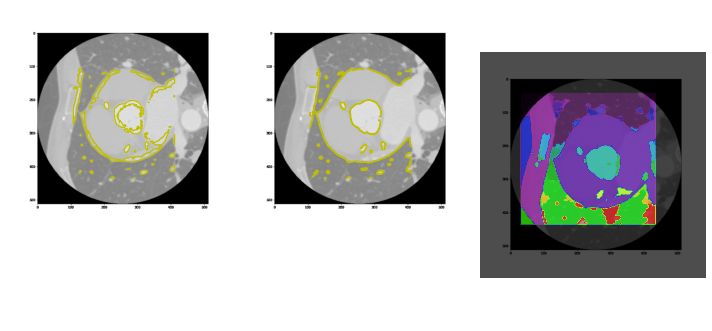

10_159.png
0


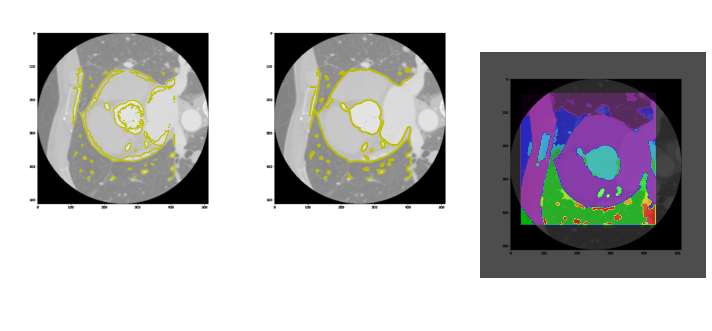

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_16.png
1


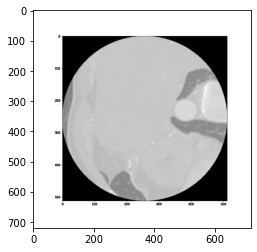

10_160.png
0


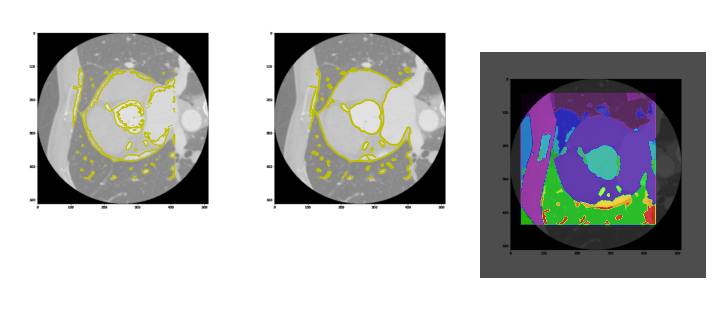

10_161.png
0


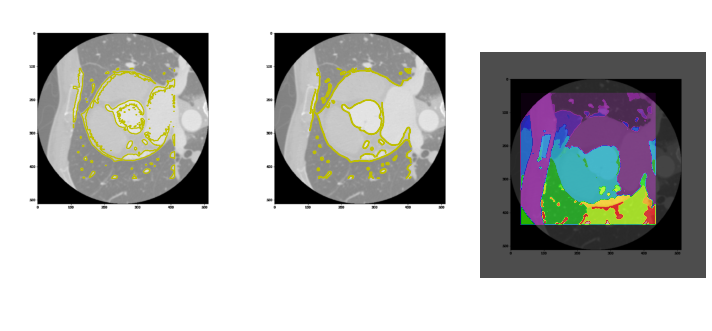

10_162.png
0


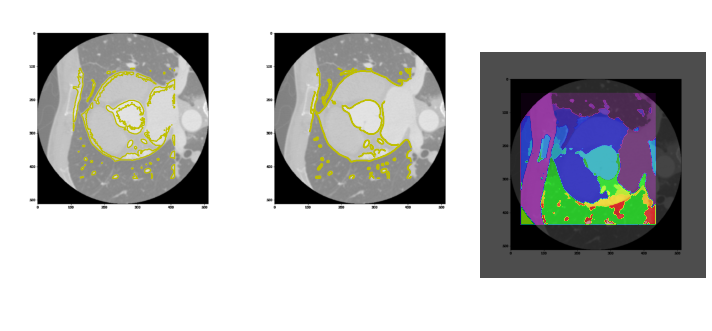

10_163.png
0


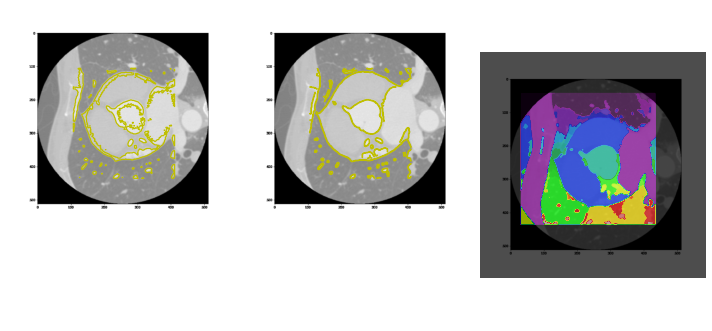

10_164.png
0


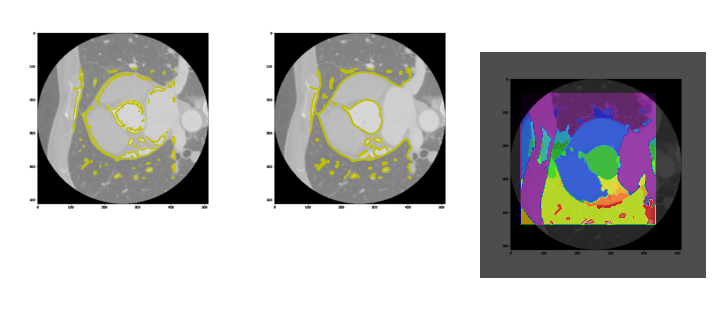

10_165.png
0


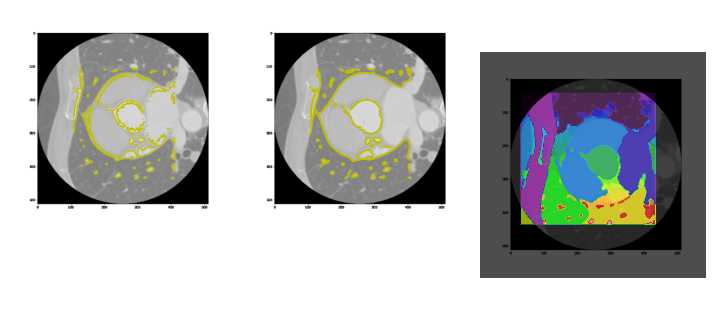

10_166.png
0


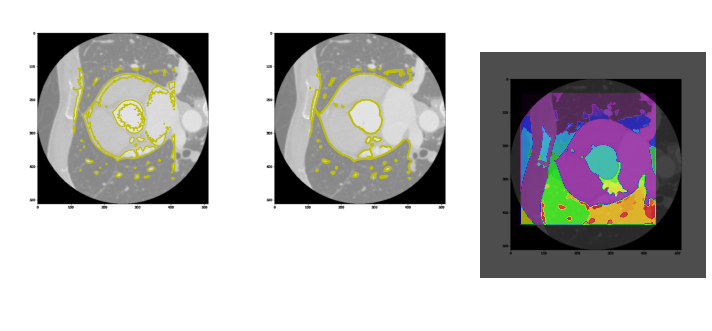

10_167.png
0


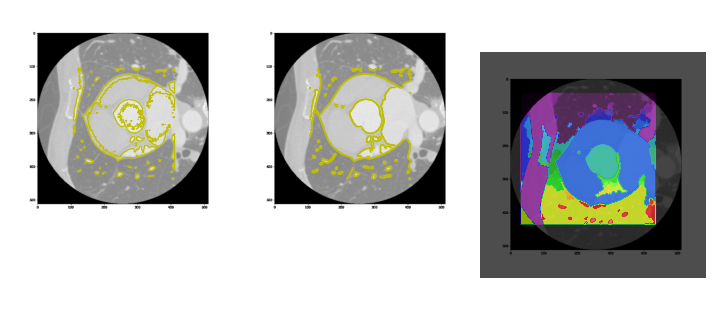

10_168.png
0


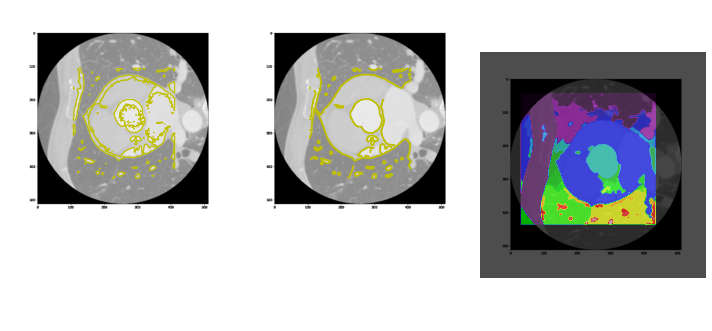

10_169.png
0


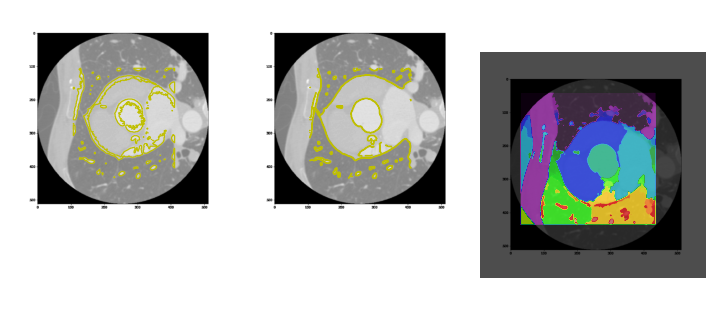

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_17.png
1


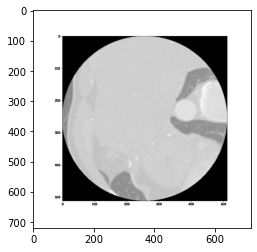

10_170.png
0


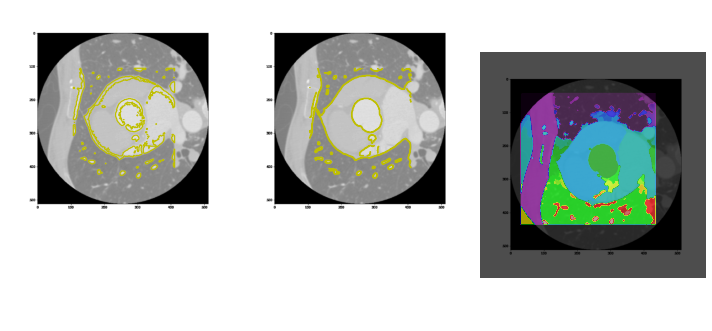

10_171.png
0


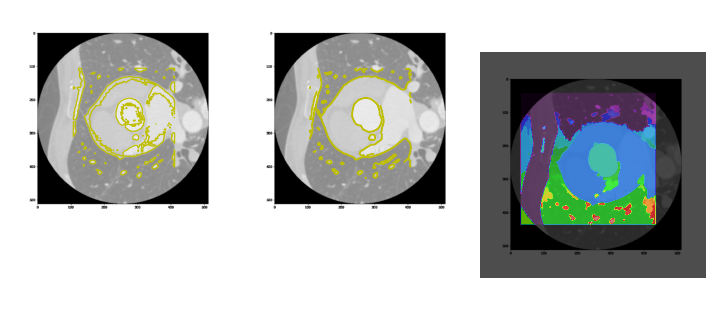

10_172.png
0


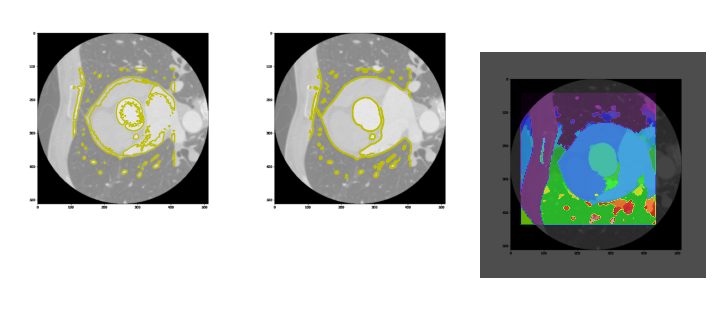

10_173.png
0


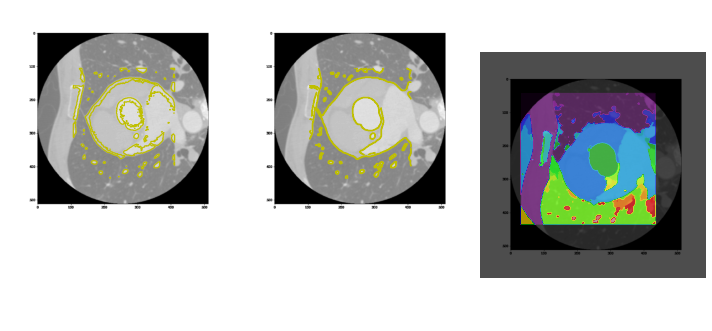

10_174.png
0


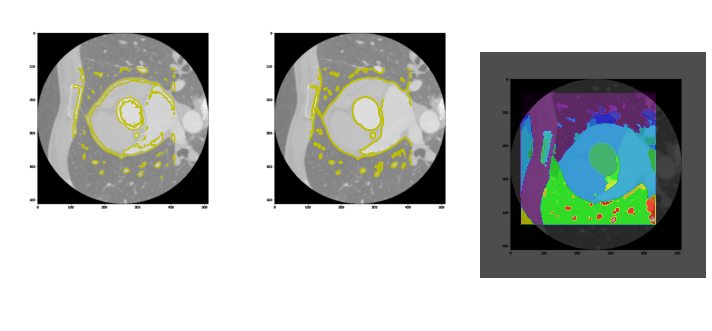

10_175.png
0


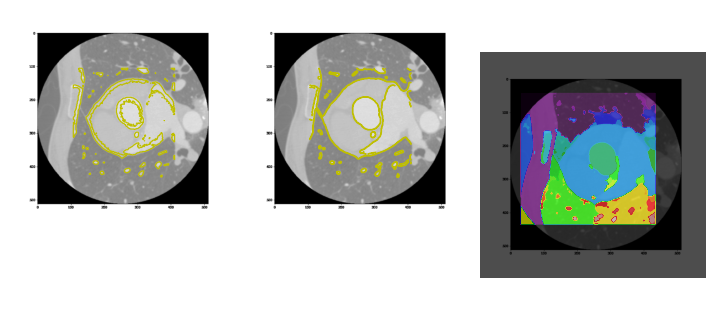

10_176.png
0


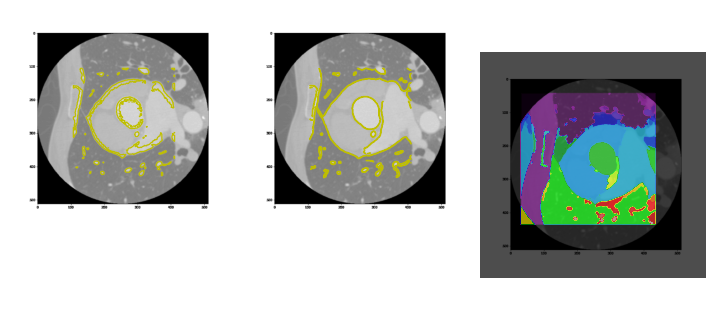

10_177.png
0


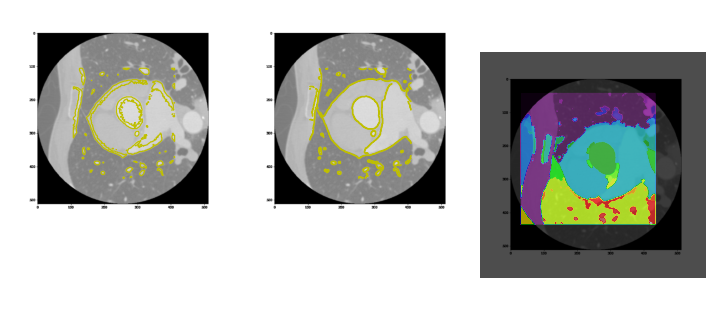

10_178.png
0


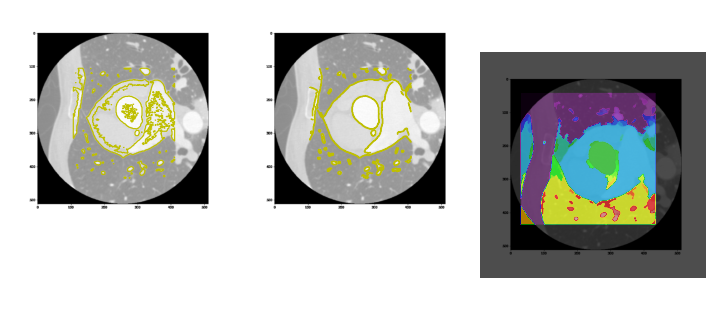

10_179.png
0


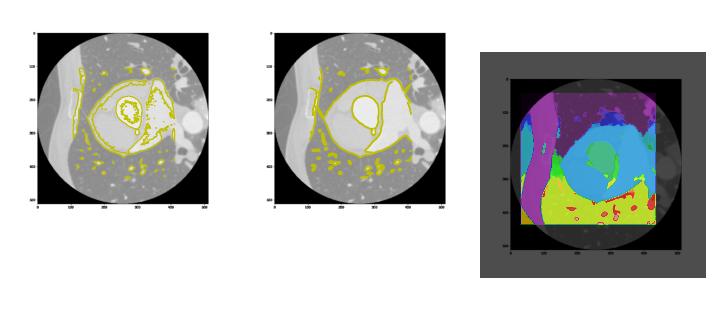

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_18.png
1


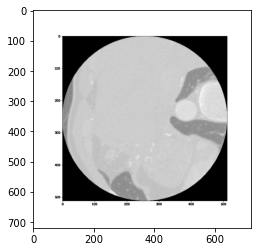

10_180.png
0


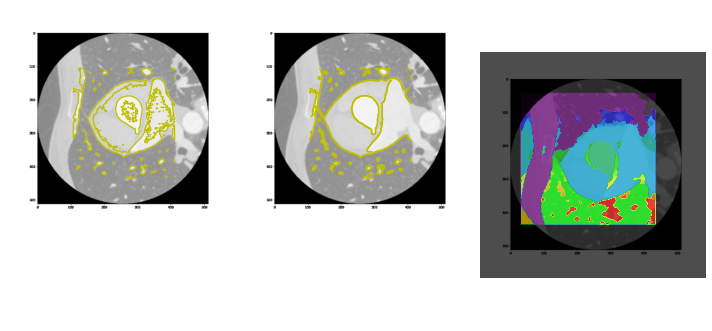

10_181.png
0


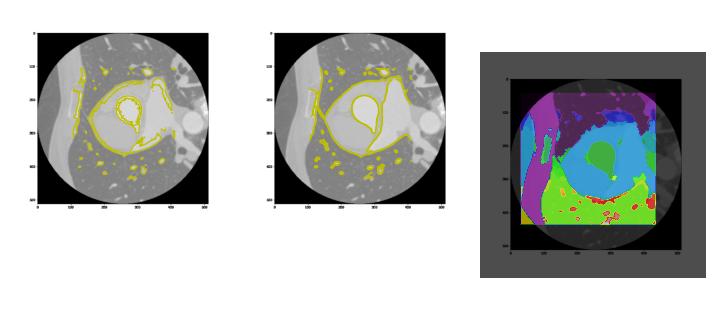

10_182.png
0


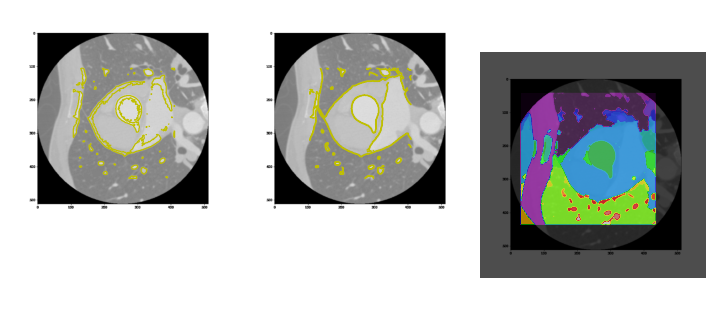

10_183.png
0


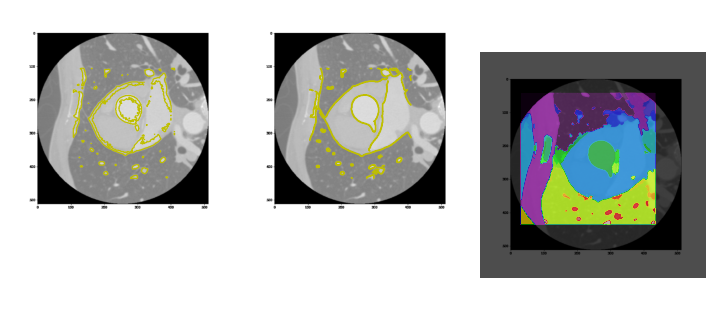

10_184.png
0


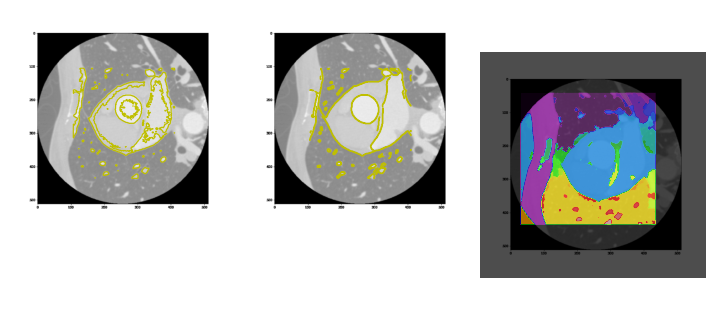

10_185.png
0


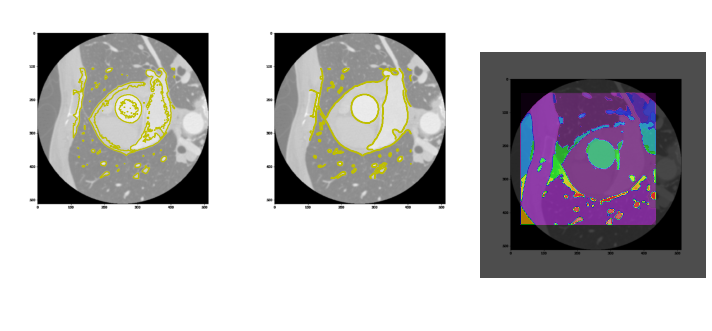

10_186.png
0


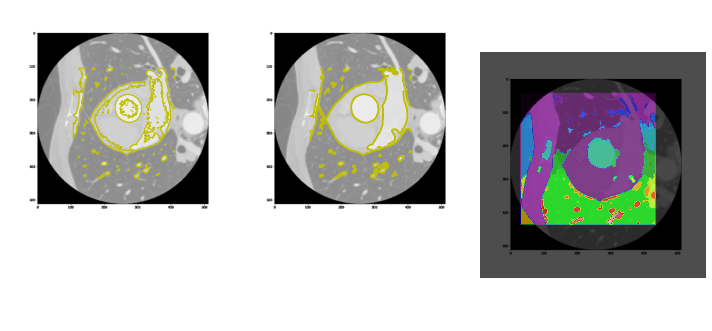

10_187.png
0


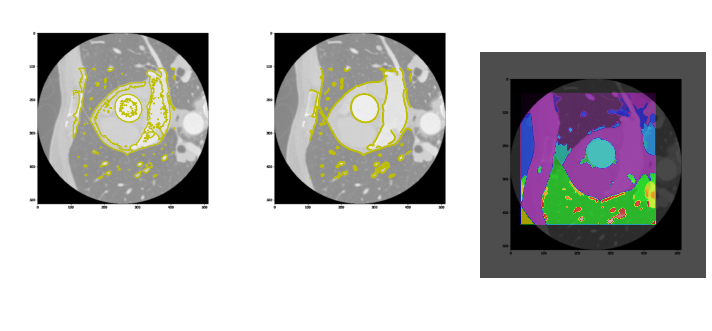

10_188.png
0


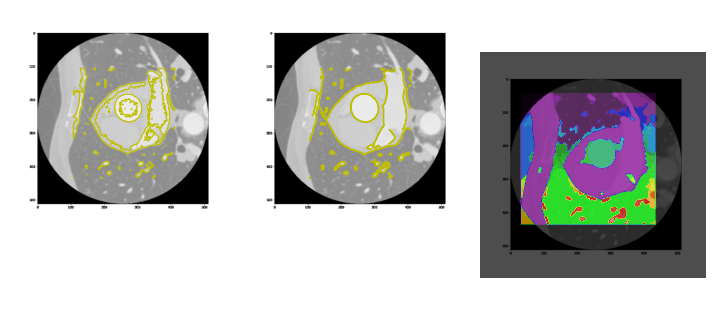

10_189.png
0


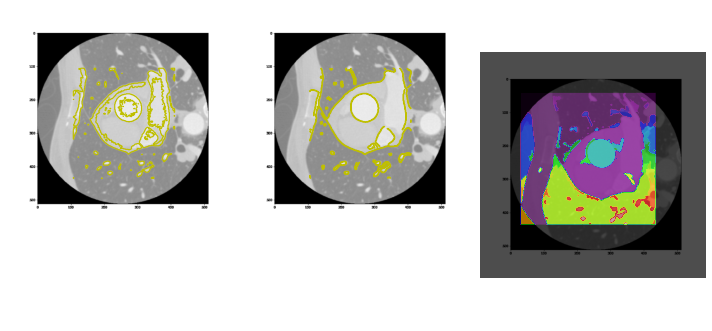

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_19.png
1


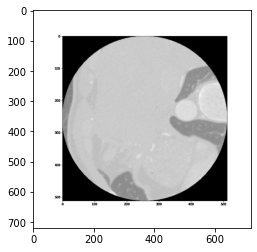

10_190.png
0


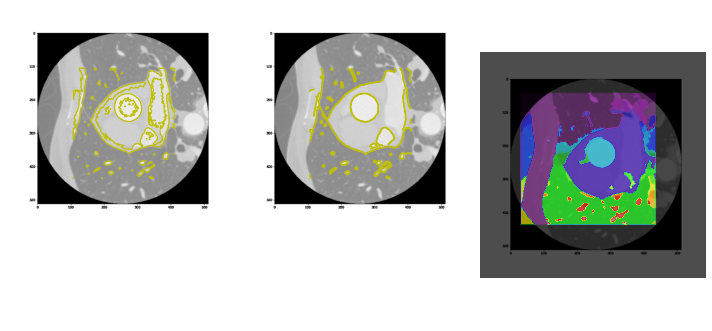

10_191.png
0


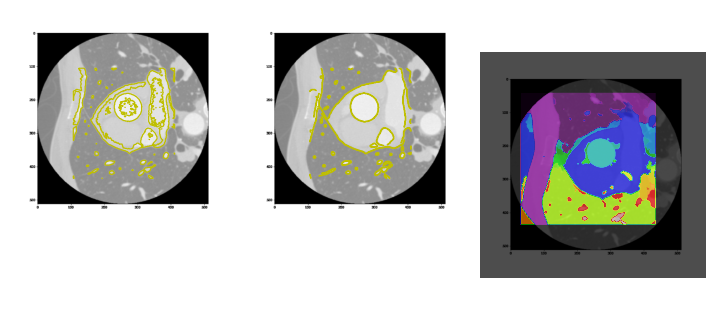

10_192.png
0


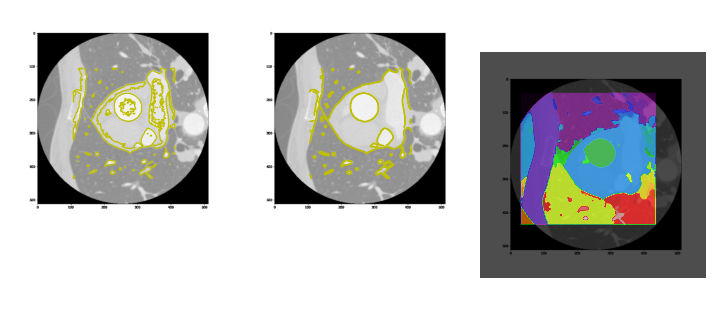

10_193.png
0


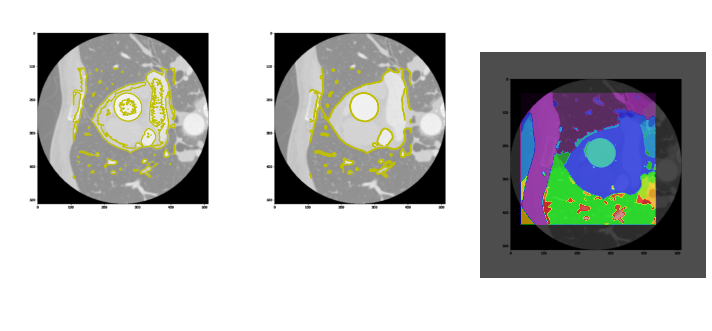

10_194.png
0


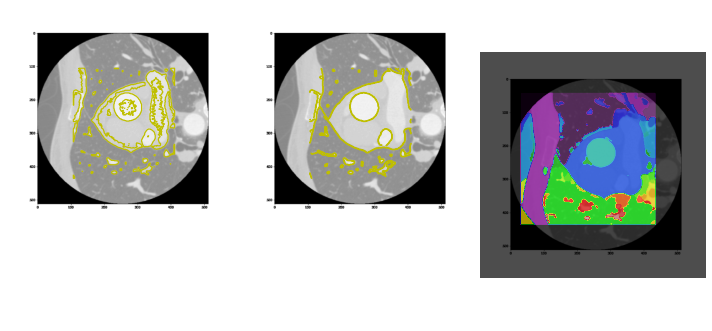

10_195.png
0


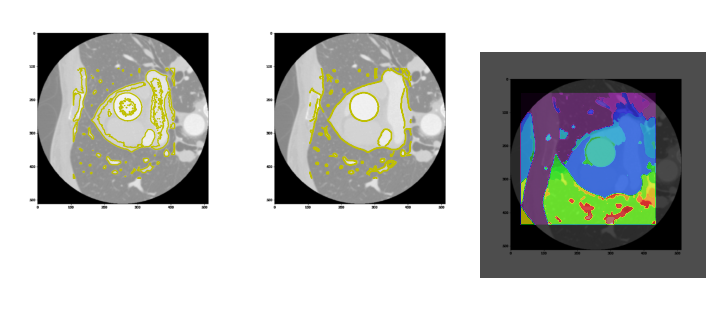

10_196.png
0


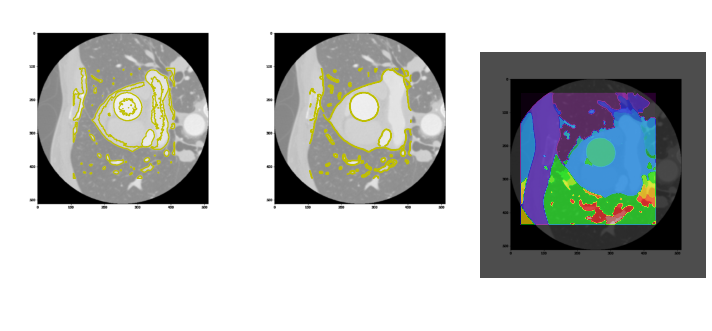

10_197.png
0


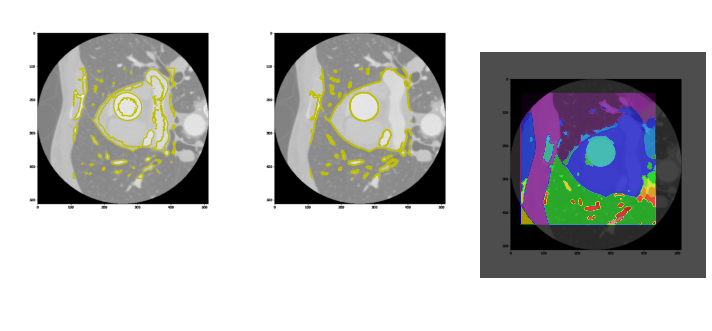

10_198.png
0


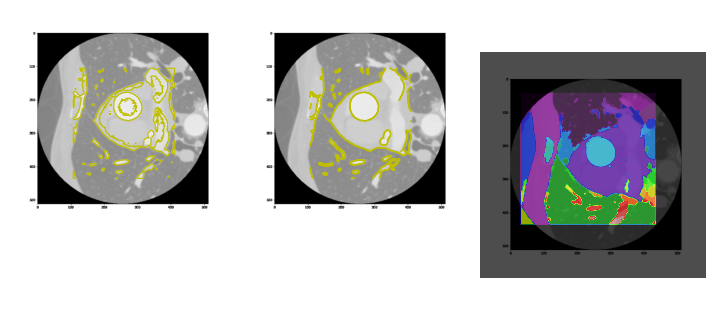

10_199.png
0


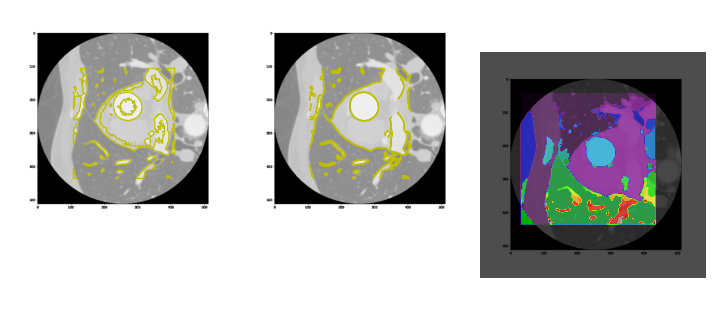

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_20.png
1


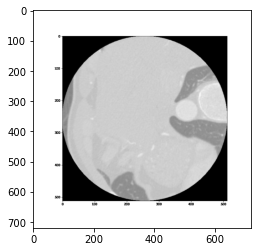

10_200.png
0


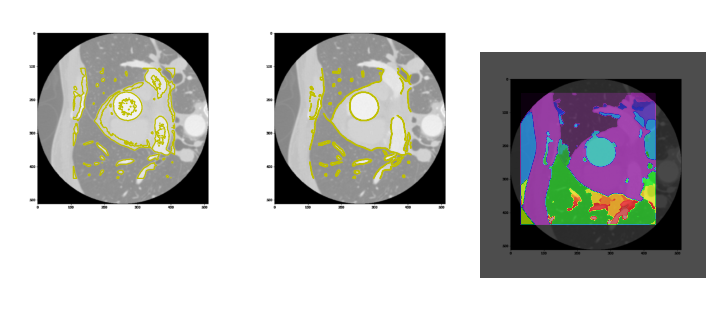

10_201.png
0


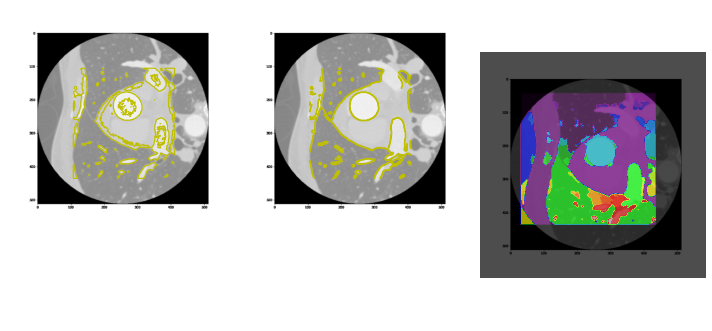

10_202.png
0


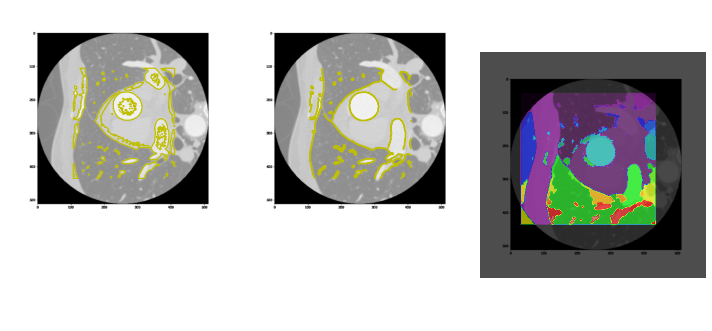

10_203.png
0


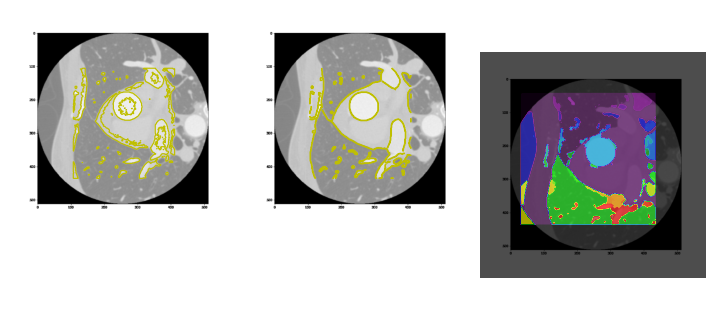

10_204.png
0


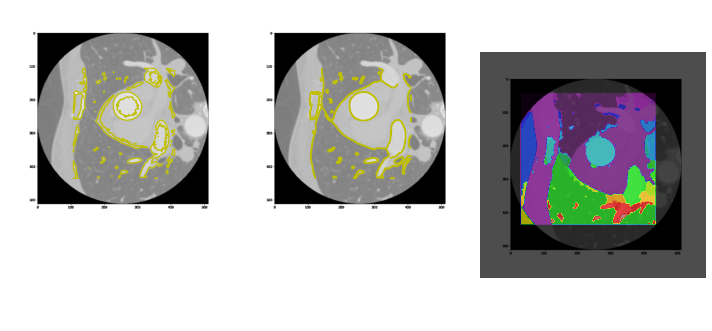

10_205.png
0


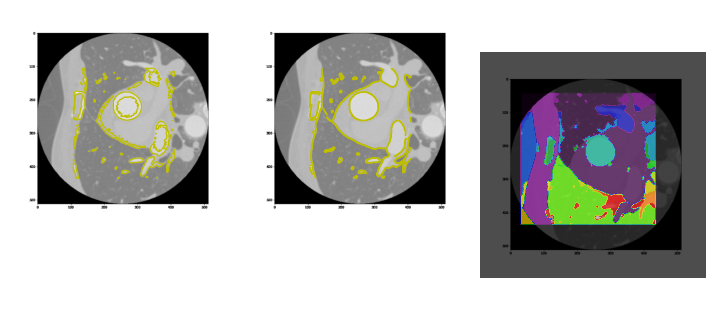

10_206.png
0


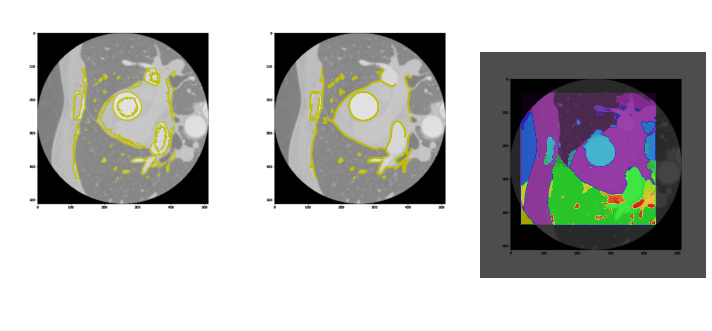

10_207.png
0


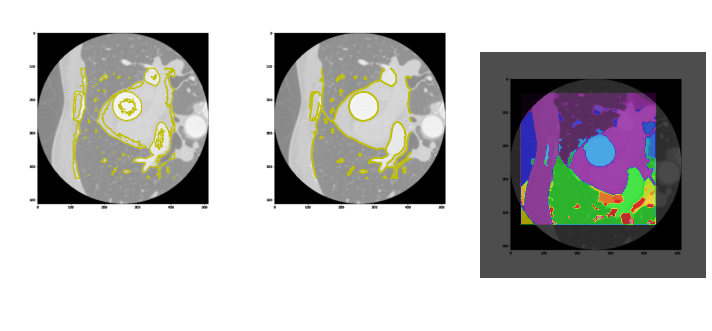

10_208.png
0


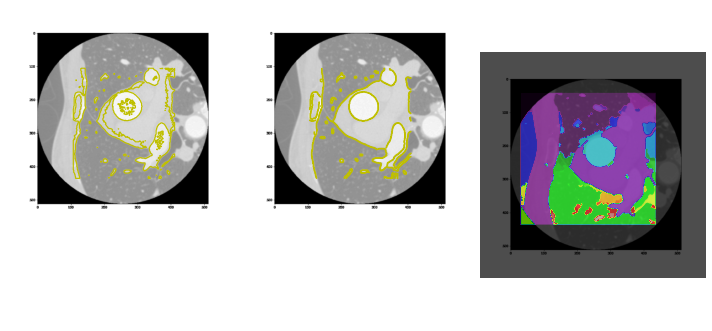

10_209.png
0


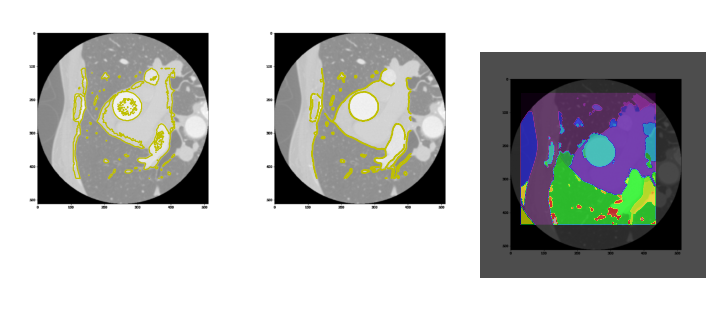

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_21.png
1


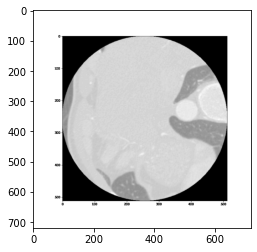

10_210.png
0


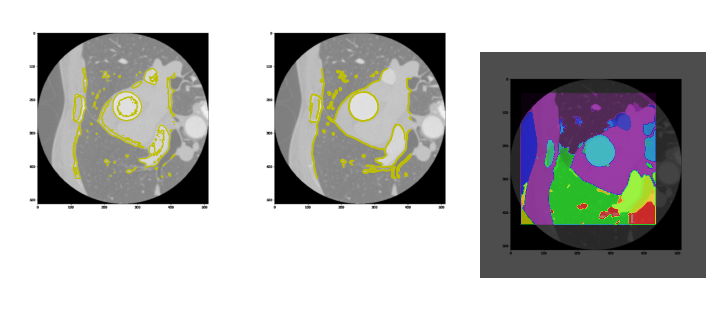

10_211.png
0


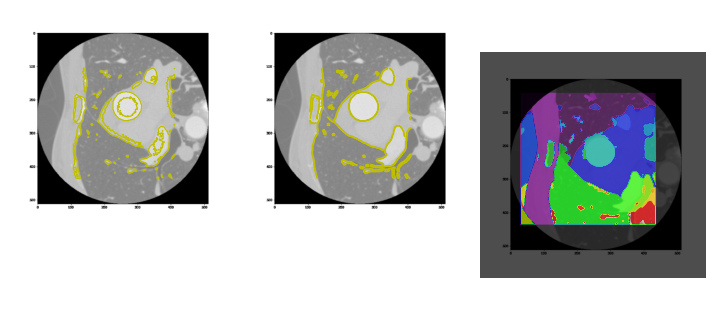

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_22.png
1


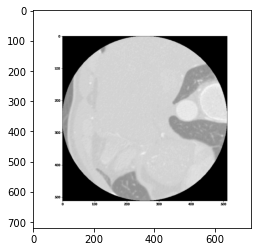

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_23.png
1


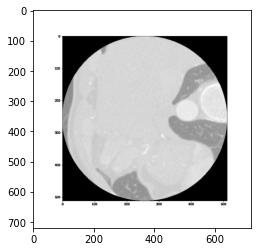

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_24.png
1


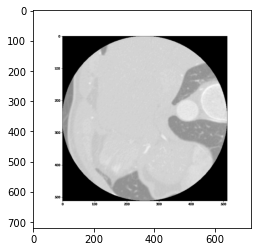

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_25.png
1


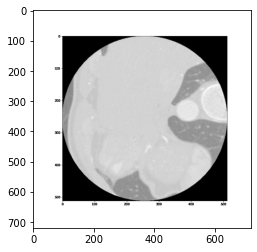

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_26.png
1


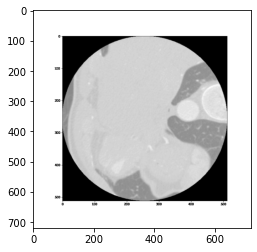

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_27.png
1


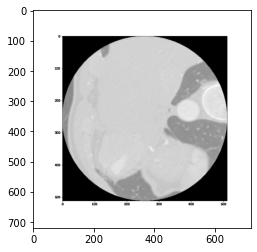

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_28.png
1


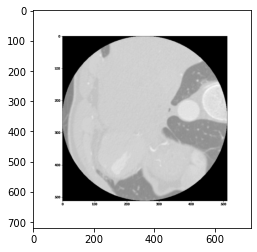

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_29.png
1


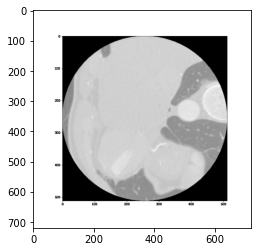

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_30.png
1


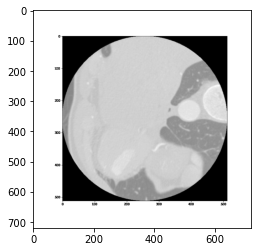

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_31.png
1


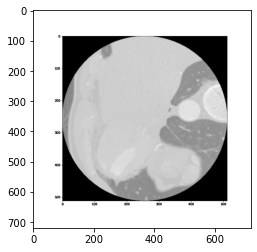

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_32.png
1


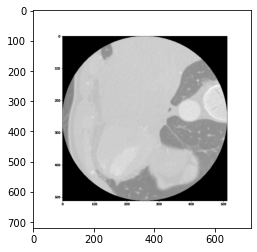

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_33.png
1


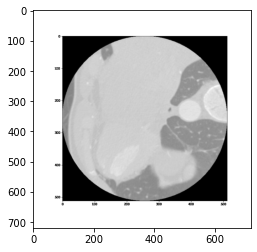

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_34.png
1


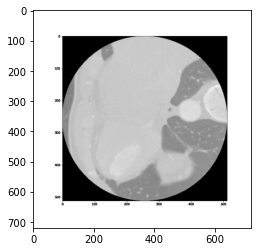

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_35.png
1


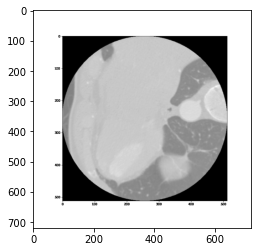

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_36.png
1


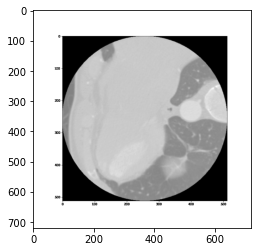

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_37.png
1


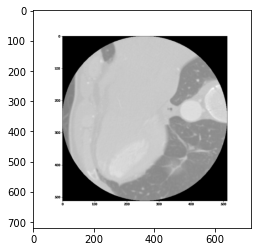

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_38.png
1


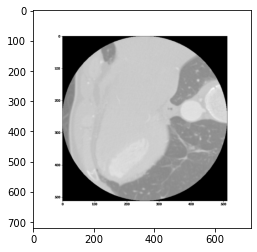

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_39.png
1


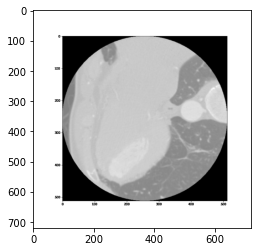

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_40.png
1


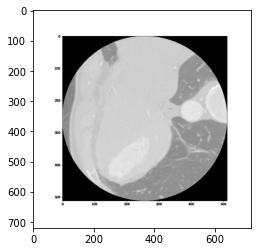

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_41.png
1


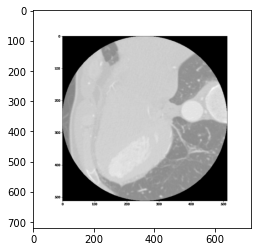

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_42.png
1


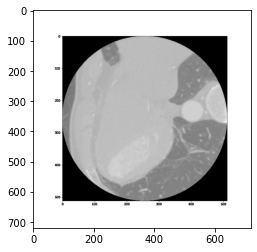

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_43.png
1


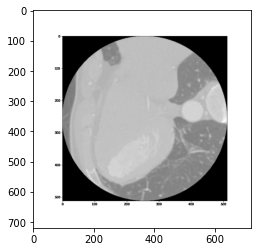

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_44.png
1


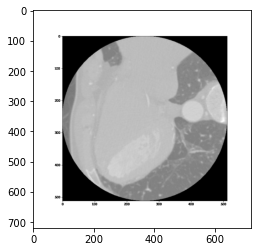

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_45.png
1


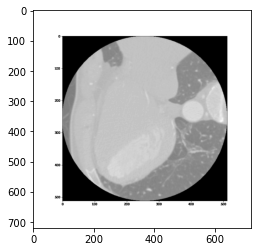

10_46.png
0


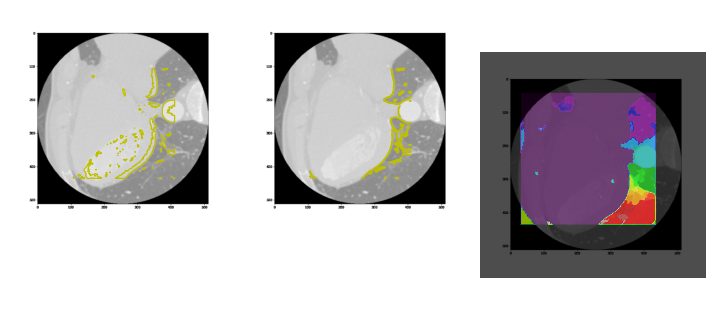

10_47.png
0


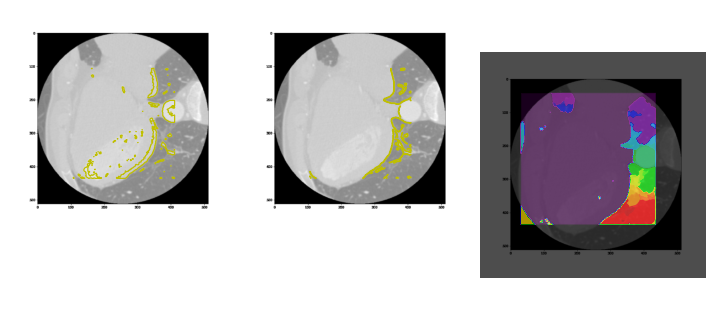

10_48.png
0


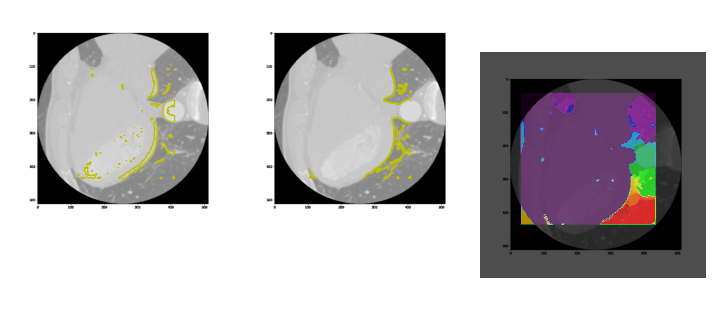

10_49.png
0


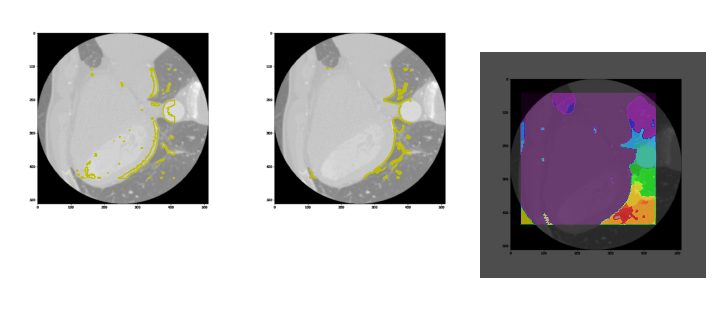

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


10_50.png
1


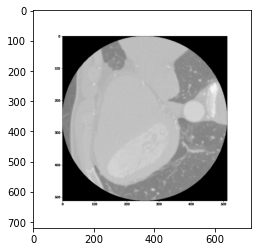

10_51.png
0


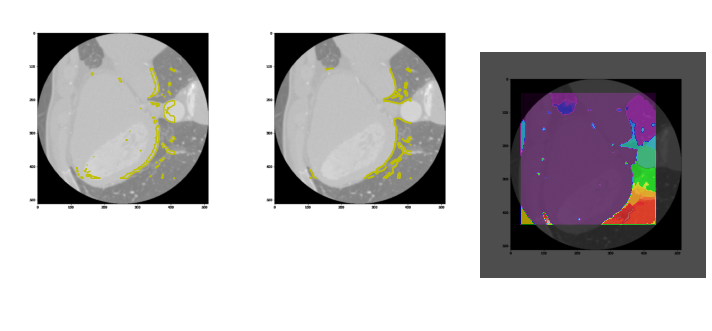

10_52.png
0


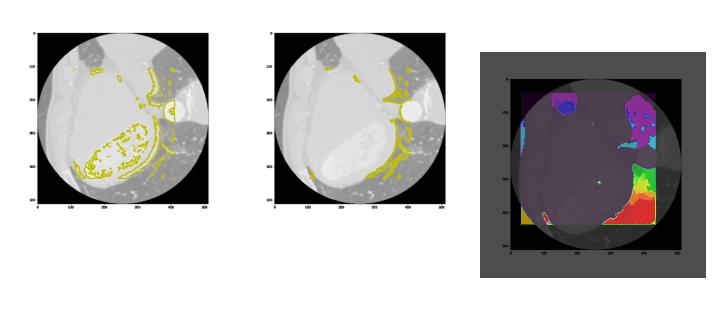

10_53.png
0


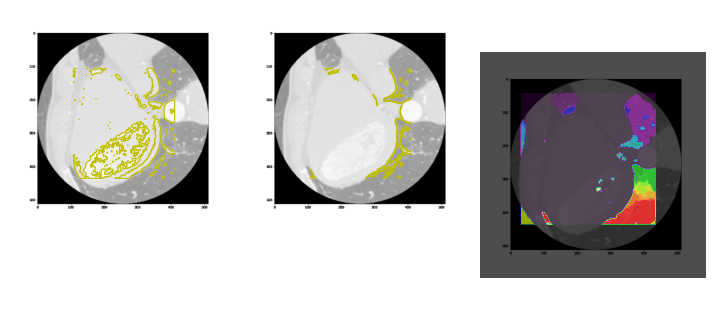

10_54.png
0


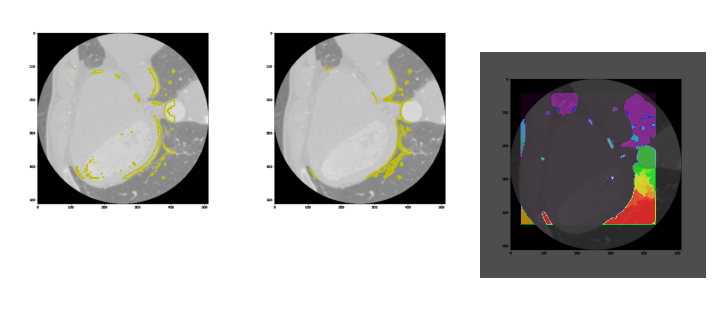

10_55.png
0


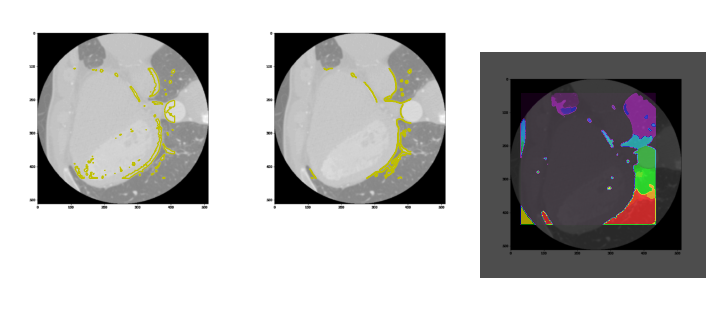

10_56.png
0


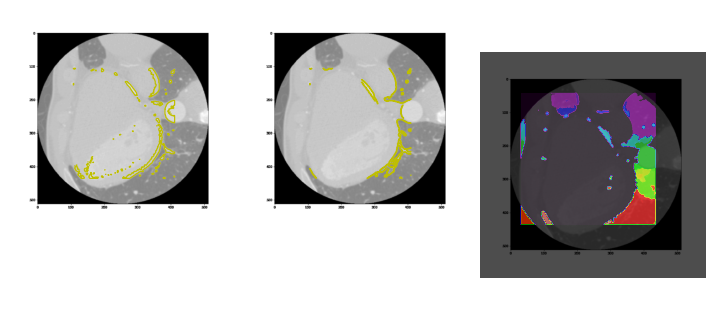

10_57.png
0


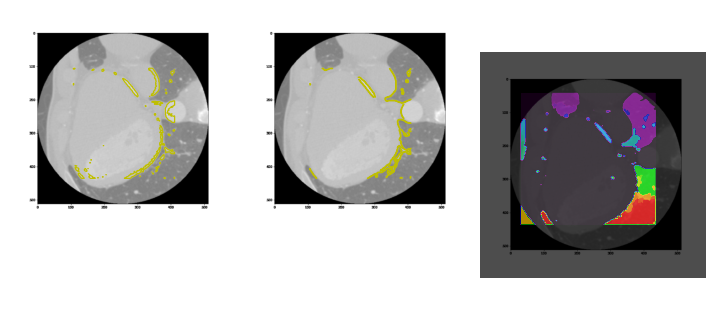

10_58.png
0


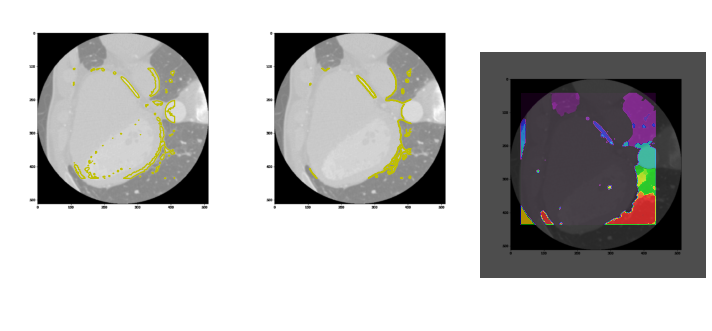

10_59.png
0


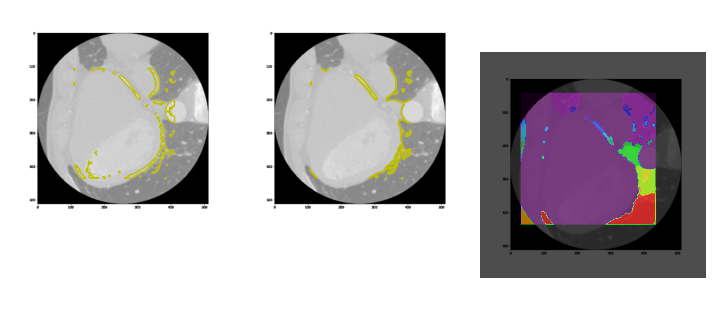

10_60.png
0


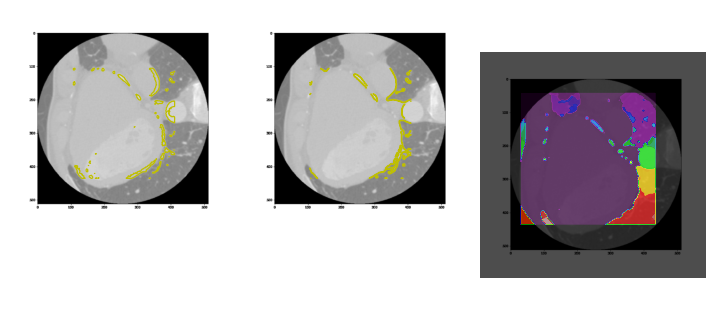

10_61.png
0


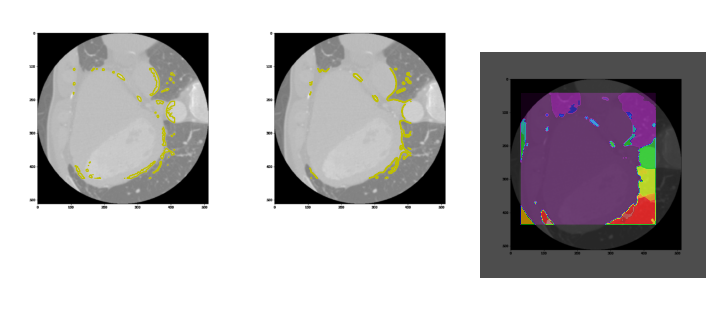

10_62.png
0


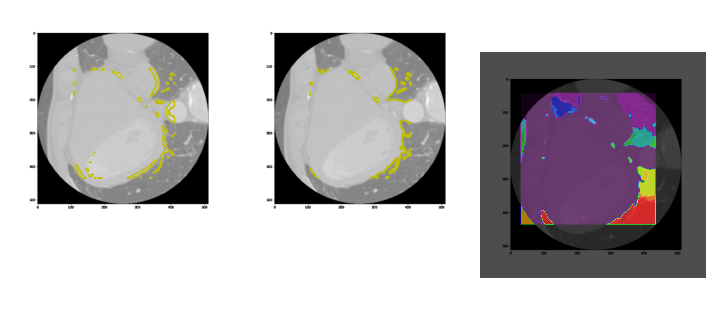

10_63.png
0


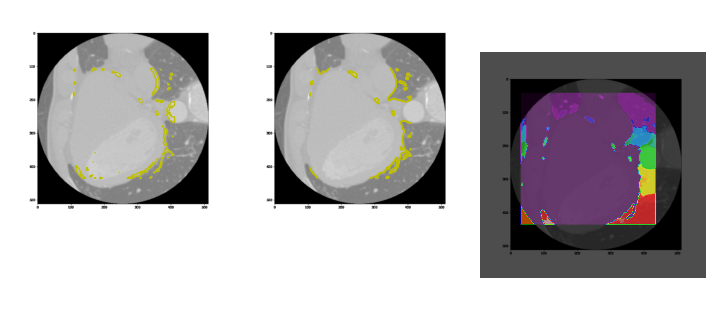

10_64.png
0


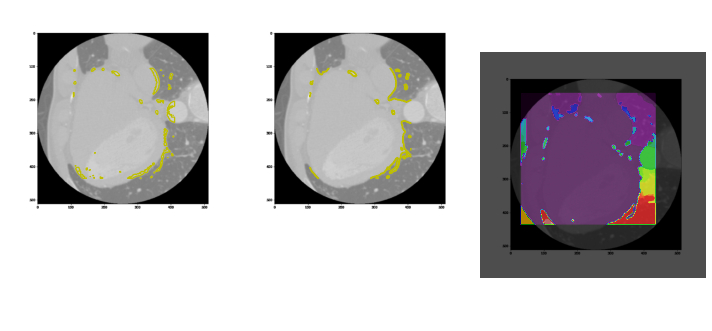

10_65.png
0


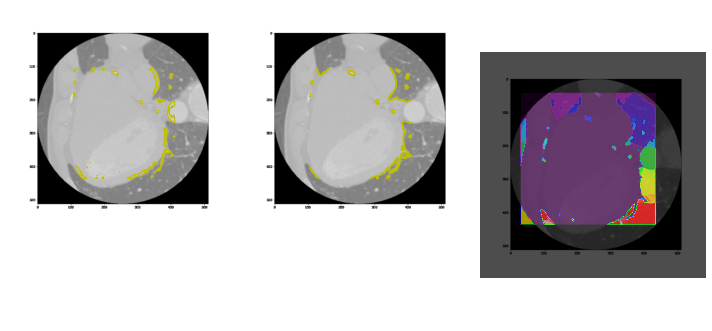

10_66.png
0


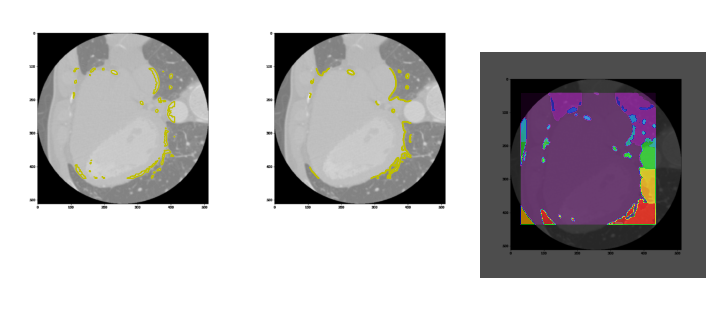

10_67.png
0


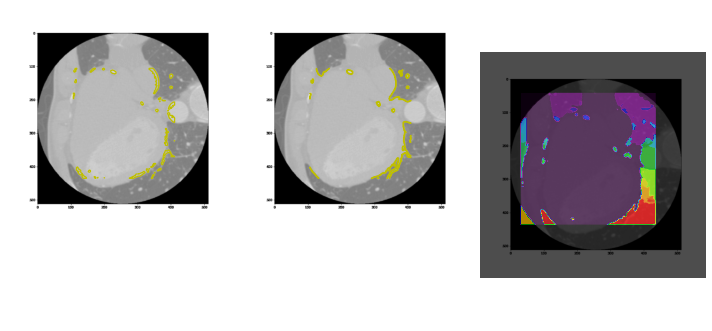

10_68.png
0


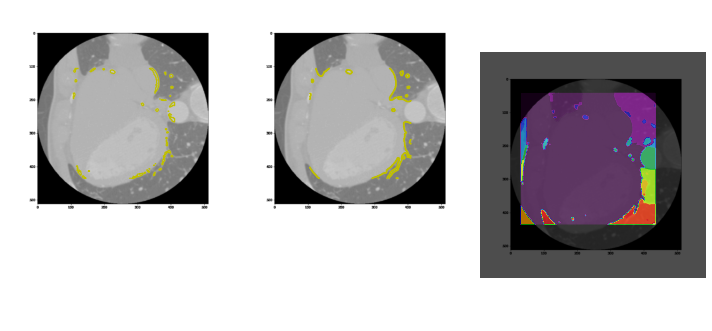

10_69.png
0


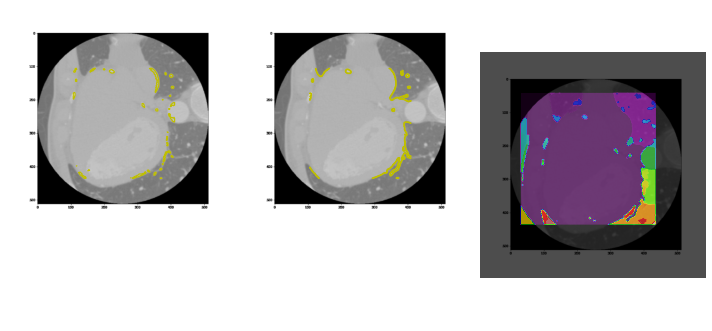

10_70.png
0


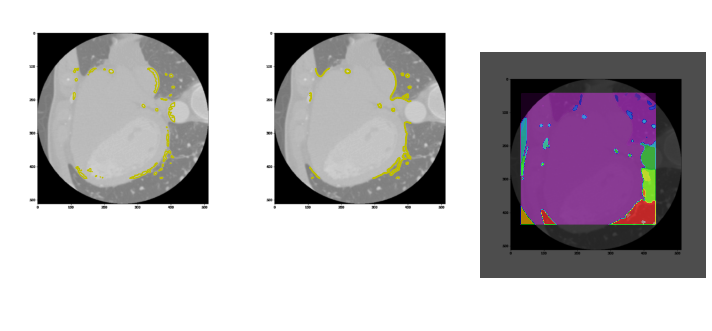

10_71.png
0


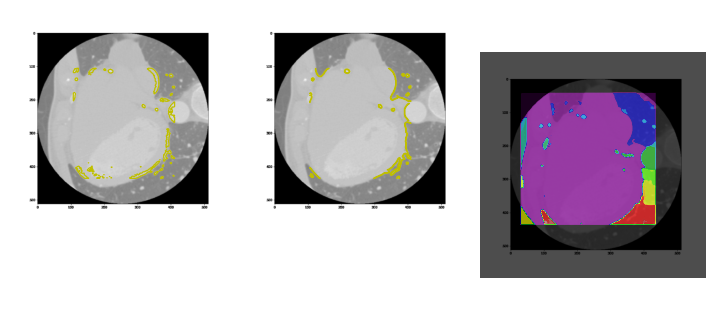

10_72.png
0


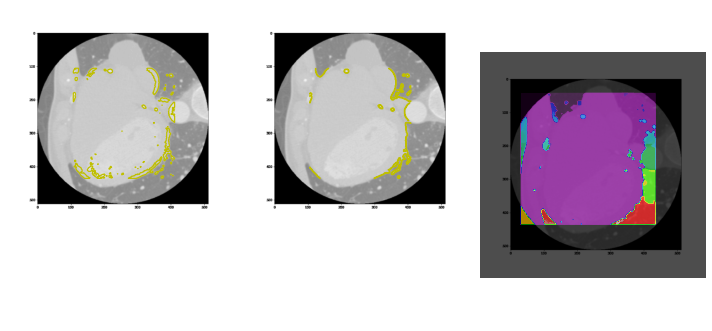

10_73.png
0


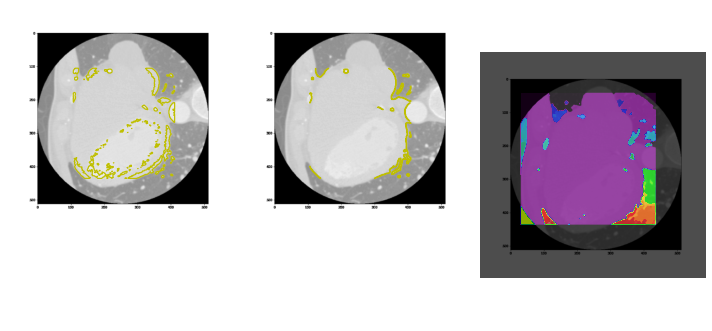

10_74.png
0


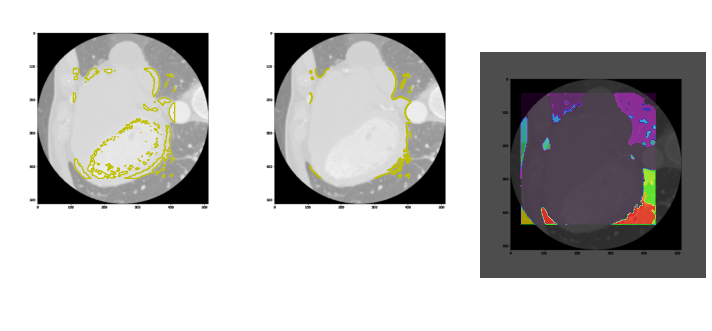

10_75.png
0


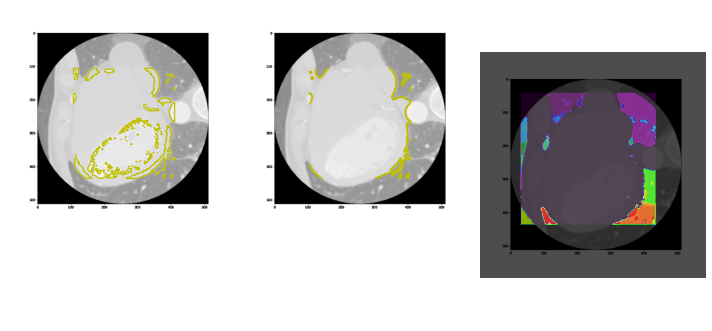

10_76.png
0


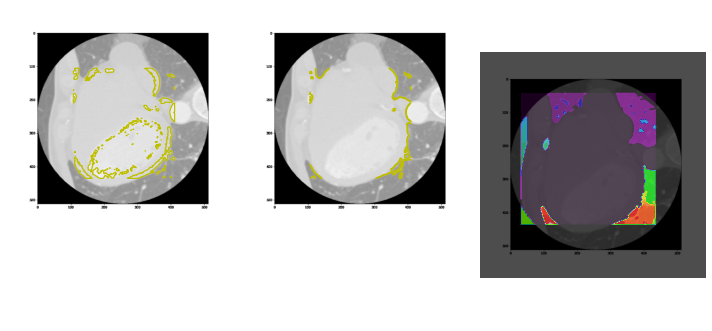

10_77.png
0


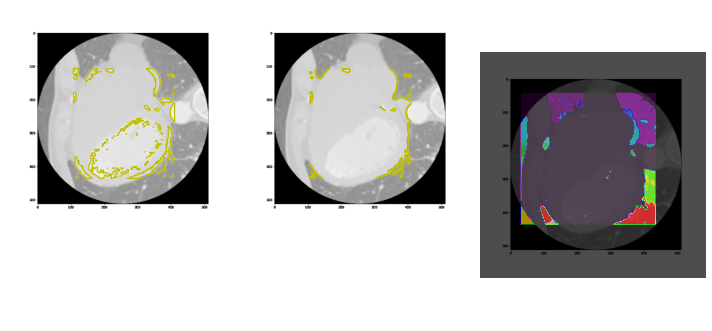

10_78.png
0


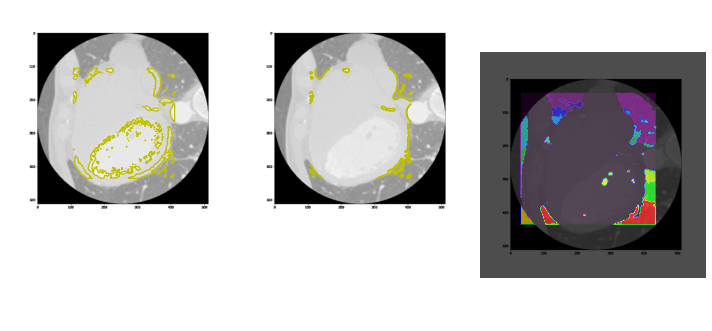

10_79.png
0


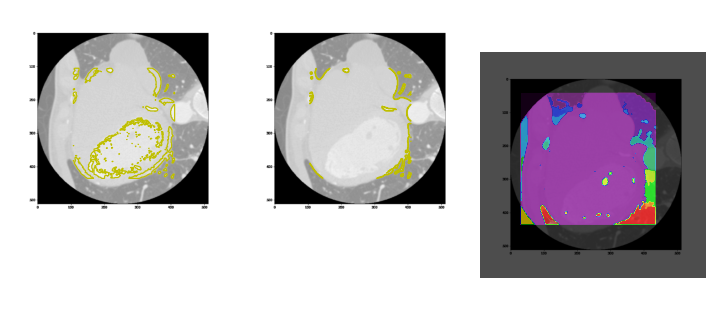

10_80.png
0


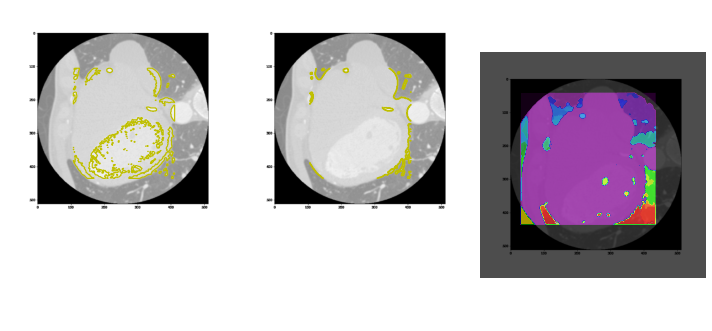

10_81.png
0


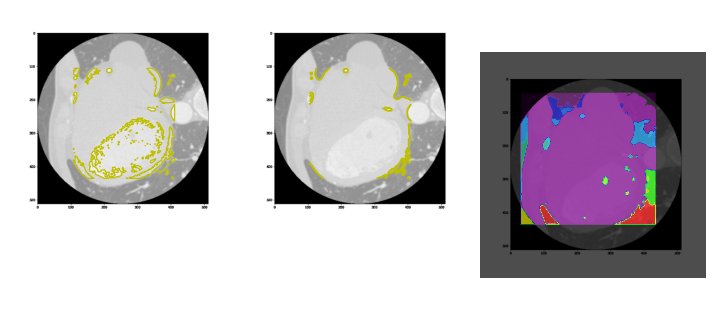

10_82.png
0


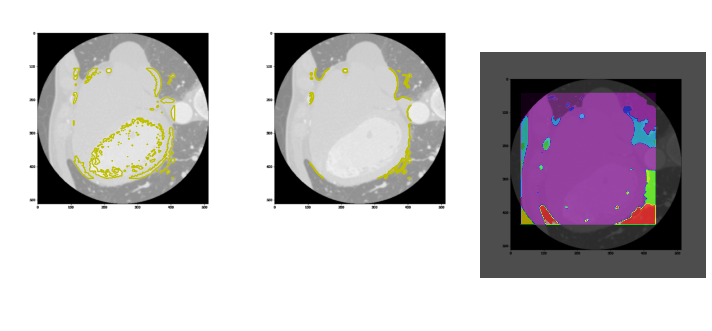

10_83.png
0


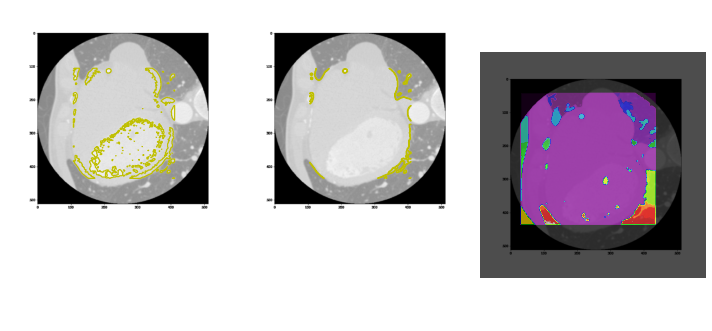

10_84.png
0


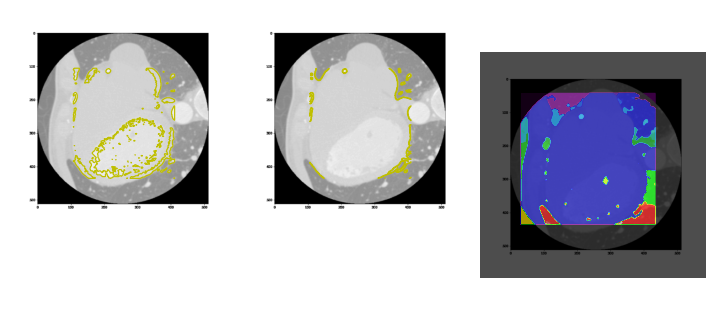

10_85.png
0


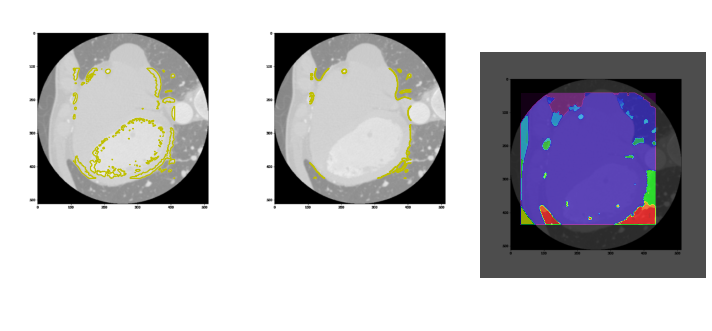

10_86.png
0


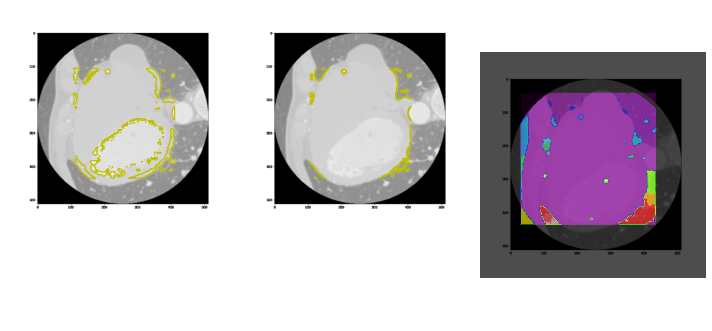

10_87.png
0


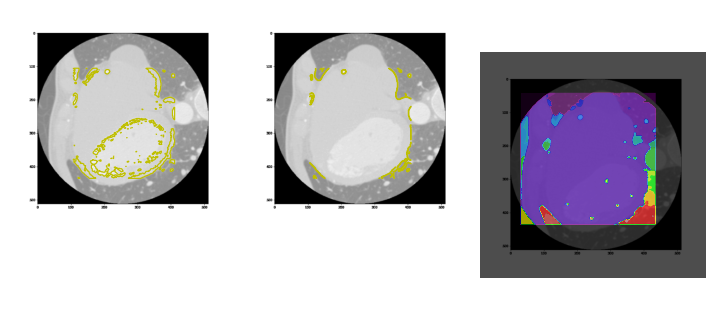

10_88.png
0


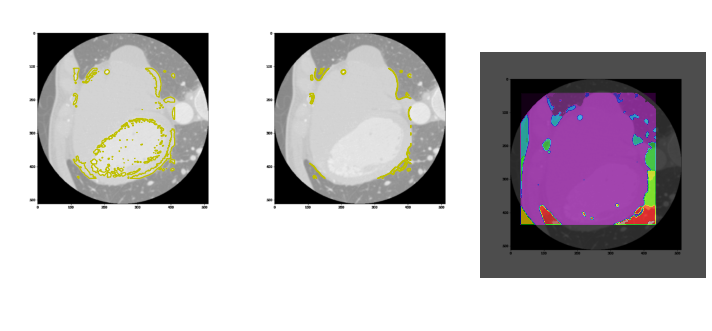

10_89.png
0


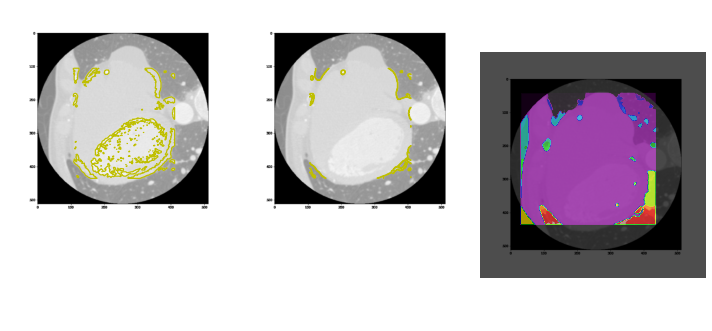

10_90.png
0


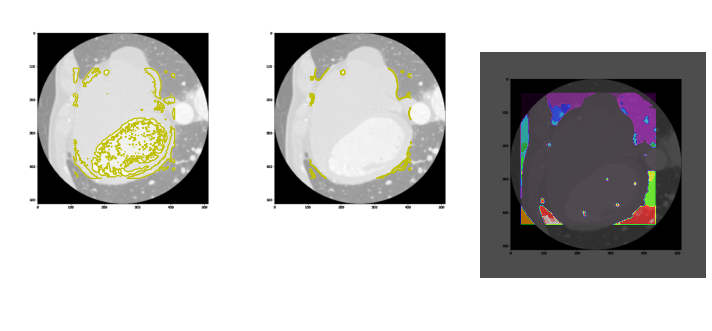

10_91.png
0


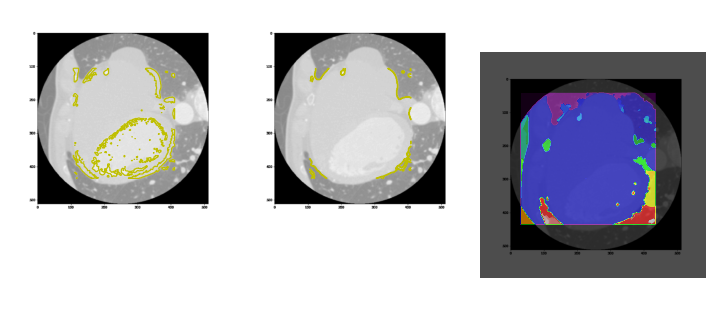

10_92.png
0


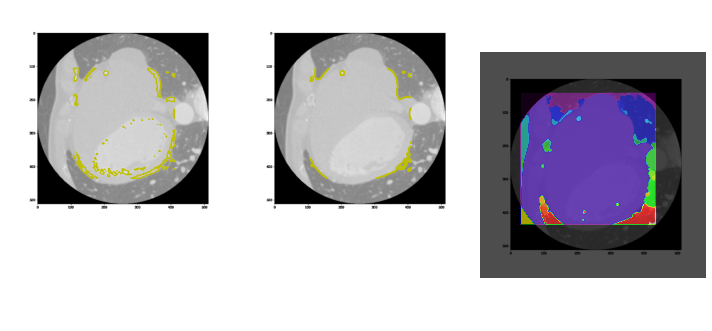

10_93.png
0


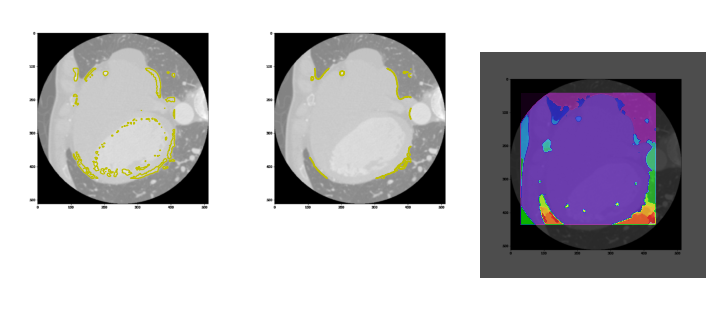

10_94.png
0


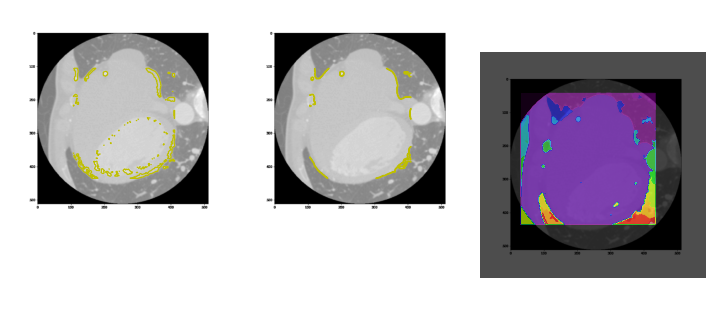

10_95.png
0


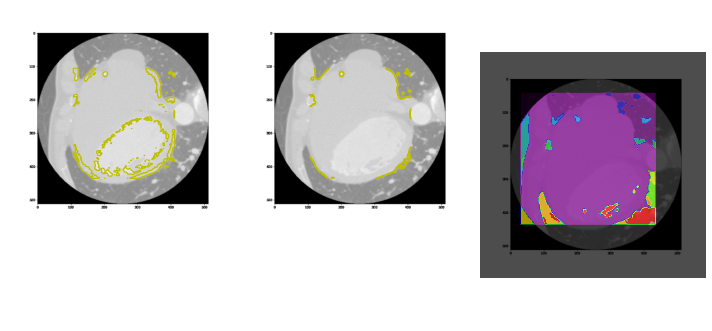

10_96.png
0


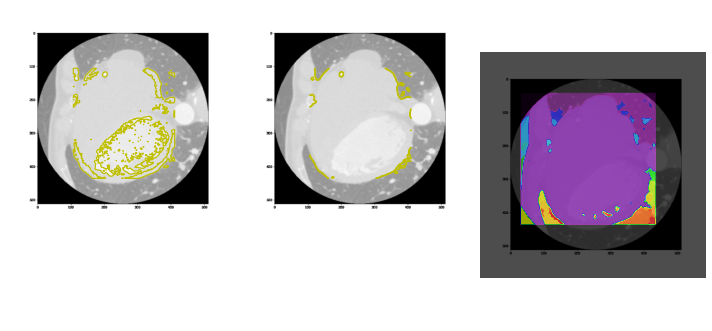

10_97.png
0


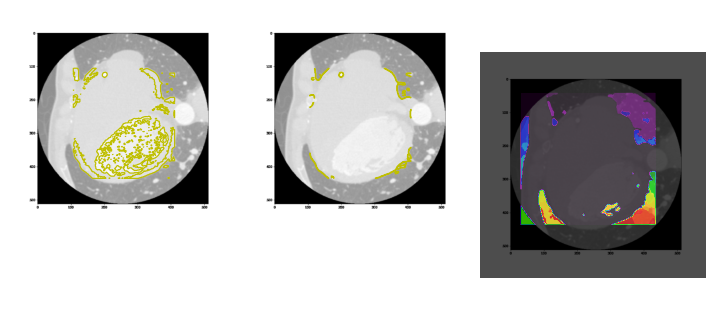

10_98.png
0


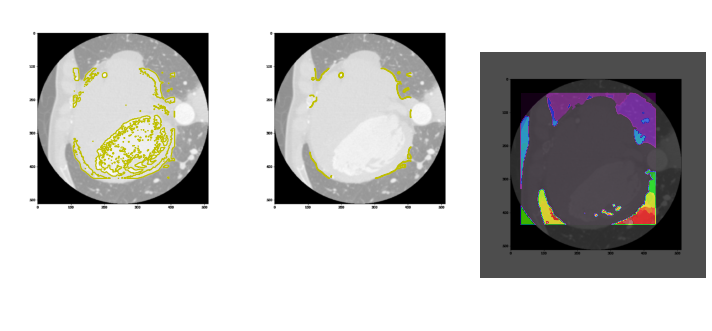

10_99.png
0


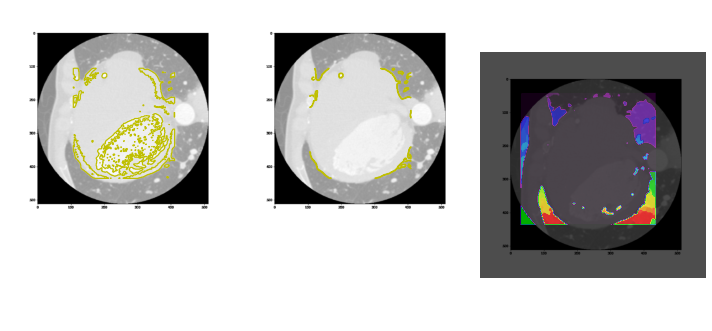

In [9]:
from skimage.morphology import disk
from skimage.segmentation import watershed
from skimage import data
from skimage.filters import rank
from skimage.util import img_as_ubyte
from scipy import ndimage as ndi
from skimage.filters import sobel,meijering, sato, hessian
import skimage.io
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
from tqdm import tqdm
from skimage.transform import resize
import medpy
from medpy.metric.binary import dc, hd
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu


evalupath = "C:/Users/Shuo/Desktop/514 project/ASOCA2020Data/Final_test/gt1"
savepath = "C:/Users/Shuo/Desktop/514 project/ASOCA2020Data/Final_test/result"
dice = []
hd = []
evalu_img = []
e_img = []
s = []
groundtruth = []


for Test1 in os.listdir(Test):
    path = os.path.join(Test)
    m = tf.keras.models.load_model("64x3-CNN.model")  # extract model
    ind = 0
    p = m.predict([prepare(Test)])  # Prediction 

    x = int(p[ind][0]) # Result for classification 
    print(Test1)
        
    print(x)  # Print classification result

        # Use classification result to get automated segmentation
        # 0 means image has the coronary artery lumen
        # 1 means image does not have coronary artery lumen

        # Has coronary artery lumen
    if x == 0:
            
            # Segmentation
        IMG_SIZE = 512  # 50 in txt-based
        img = skimage.io.imread(Test+'/'+Test1)
        img1 = img[:,:,1]
        img2 =  unsharp_mask(img1, radius=10, amount=5)

            # Denoise the image
        denoised = rank.median(img2)
        markers = rank.gradient(denoised, disk(4.9)) < 63
        markers = ndi.label(markers)[0]

            # Local gradient
        gradient = rank.gradient(denoised, disk(2))
        zeros = np.zeros(shape=[720,720], dtype=np.uint8)
        labels = watershed(gradient, markers)
        # ROI
        zeros[130:550, 130:560] = labels[130:550, 130:560]
        thresh = threshold_otsu(zeros)
        evalu = zeros > thresh
        result = evalu_img.append(evalu)
            
            # Save result
        count = ind
        if count ==ind:
            im_save = skimage.io.imsave(os.path.join(savepath, "12_{:02d}.png".format(count)),evalu)
            count = ind
            
            # Evaluation
        mask = skimage.io.imread(evalupath+'/'+Test1)  
        gt = mask[:,:,1]
        gt = rgb2gray(gt)
        groundtruth.append(gt)
        zerogray = rgb2gray(zeros)
        s = skimage.io.imsave(Test1, zeros)

            # Get the dice score
        gt_dc = medpy.metric.binary.dc(evalu,gt)
        dice.append(gt_dc)

            # Get the Hausdorff distance
        gt_hd = medpy.metric.binary.hd(evalu,gt)
        hd.append(gt_hd)

            # Unsharp_mask filter

        label = cv2.imread(Test+'/'+Test1, cv2.IMREAD_GRAYSCALE)  # read in the image, convert to grayscale
        label_1 = cv2.resize(label, (IMG_SIZE, IMG_SIZE))
        label_2 = np.zeros(shape=[IMG_SIZE, IMG_SIZE], dtype=np.uint8)
        label_3 = unsharp_mask(label_1, radius=10, amount=5)
        label_2[140:390, 150:380] = label_3[140:390, 150:380]

            # Canny

        label2_1 = np.zeros(shape=[IMG_SIZE, IMG_SIZE], dtype=np.uint8)
        label2_2 = feature.canny(label_1)
        label2_1[140:390, 150:380] = label2_2[140:390, 150:380]

            # Get the Hausdorff Distance
            #gt1 = resize(gt, (IMG_SIZE, IMG_SIZE))
            #gt_hd = medpy.metric.binary.hd(label2_1,gt1)
            #hd.append(gt_hd)

            # Draw the contour and color
        fig, axes = plt.subplots(1, 3, figsize=(10, 10), sharey=True)
        axes[0].imshow(label_1, cmap=plt.cm.gray)
        axes[0].contour(label_2, [0.5], linewidths=1.2, colors='y')
            #axes[1].imshow(image_label_overlay)
        axes[1].imshow(label_1, cmap=plt.cm.gray)
        axes[1].contour(label2_1, [0.5], linewidths=1.2, colors='y')

        axes[2].imshow(img1, cmap=plt.cm.gray)
        axes[2].imshow(zeros, cmap=plt.cm.nipy_spectral, alpha=.7)

        for a in axes:
            a.axis('off')

        plt.tight_layout()
        plt.show()

        # No coronary artery lumen
    else :
        img = skimage.io.imread(Test+'/'+Test1)
        img1 = color.rgb2gray(img)
        thresh = threshold_otsu(img1)
        evalu = img1 > thresh
            
        count2 = ind
        if count2 ==ind:
            im_save = skimage.io.imsave(os.path.join(savepath, "12_{:02d}.png".format(count2)),img1)
            count2 = ind
            
        mask = skimage.io.imread(evalupath+'/'+Test1)  
        gt = mask[:,:,1]
        gt = rgb2gray(gt)
        groundtruth.append(gt)
            
        zeros = np.zeros(shape=[720,720], dtype=np.uint8)
            # Get the dice score
        gt_dc = medpy.metric.binary.dc(zeros,gt)
        dice.append(gt_dc)

            # Get the Hausdorff distance
        gt_hd = medpy.metric.binary.hd(evalu,gt)
        hd.append(gt_hd)
            
        plt.imshow(img1, cmap='gray')
        plt.show()
            
    ind += 1

In [10]:
import statistics
from statistics import *


for i in range(200):
    if dice[i] ==0.0:
        dice[i] = 1
        i +=1
    else:
        i+=1
print(dice)
print('mean dice =', mean(dice))
print('group std =', pstdev(dice))

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0.00020947584952930778, 1, 1, 0.00020756792660398115, 0.0013496449936864767, 0.0013892564170415453, 0.0002484955664249357, 1, 1, 0.0002881963028531434, 0.00030944087379412144, 1, 1, 0.0008950456350102437, 0.0006332471185200111, 1, 8.194437615746432e-06, 0.0002133132053180623, 1, 1, 1, 1.6248207619596965e-05, 0.0007648799339787846, 1, 0.00024919013207077, 0.00022532390311072166, 1, 0.0002806769929068914, 0.001954176553869469, 1, 0.0003453551737016051, 0.0007684188304834283, 0.0007563513610343702, 0.0023136762663245993, 0.001576118650211988, 0.0025452773114444643, 0.0016332181007228934, 0.0022838192967087976, 0.0035533604028690096, 0.004337940293179578, 1, 0.005820348834965321, 0.004149425776759345, 0.004482025690786434, 0.002857828824572681, 0.0011767456359102245, 0.003947407968955072, 0.003950633845328325, 0.004305484366991286, 0.005143728520381455, 0.00451257499275163, 1, 0.004394601786732561, 0.004232301198768646, 0.004242110708742887, 0.005

In [11]:
for i in range(200):
    if hd[i] ==81.0:
        hd[i] = 0
        i +=1
    else:
        i+=1
print(hd)
print('mean Hausdorff distance =', mean(hd))
print('group std =', pstdev(hd))

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 379.6801285292661, 312.0256399721023, 326.84093990808435, 325.51804865475583, 329.946965435356, 333.83978193139296, 329.460164511584, 299.34762400927787, 284.43101096751036, 275.27440854536405, 0, 331.6986584235758, 331.0498451895122, 323.3357388226671, 341.7133301467767, 404.7530111067736, 330.32408328791286, 329.57700162480995, 328.18439938546743, 329.73474187595093, 329.460164511584, 0, 331.7303121513016, 313.8470965295043, 358.66558240232644, 325.4243383645421, 326.0199380406051, 331.48453960931573, 333.9281359813815, 330.26201719241044, 325.88648330361906, 318.44622779992227, 0, 337.31291110777244, 349.85711369071805, 325.6316937891642, 317.6822311681911, 351.0911562543266, 319.164534370597, 331.68961394653286, 326.90671452266014, 330.15148038438355, 310.2208890452092, 0, 307.514227313144, 321.6224494652076, 323.35893369443187, 328.58636612008115, 336.7625276066207, 280.1892217769984, 270.04073766748604, 249.23884127479008, 303.5852433831394, 272.